# Multilayer graph modeling of gene expression data

In this notebook you will find the code for multilayer graph gene classification.

In order to replicate the results you need to:
- download the necessary libraries 
- download the CHIP-seq data following Chromoformer pre-procesing pipeline
- download the co-expression database Coexpressdb

In this notebook you will able to replicate ALL stepps of the experiments.

If you wish to apply the code to your own data, you just need to replace the CHIP-seq data with your own.

Please, ensure that the data outputed from Chromoformer have the following format: "{chrom}\_{start_window}\_{end_window}.npy". Otherwise, you will need to correct accordingly the code.

*note*: it will be necessary to change pathways and computer-specific variables in the second cell so that the code will work

# Libraries

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import re
import os
from pathlib import Path
import mygene
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, roc_auc_score, precision_score, recall_score, f1_score
from scipy import stats
from scipy.stats import pearsonr 
import xgboost as xgb
from sklearn.model_selection import RandomizedSearchCV, PredefinedSplit
from sklearn.metrics import make_scorer
from lightgbm import LGBMRegressor
from sklearn.utils import shuffle
import ast
from statsmodels.stats.multitest import multipletests
from scipy.stats import spearmanr
from scipy.stats import ttest_ind
import torch
from tqdm import tqdm
import torch.nn as nn
from ast import literal_eval
from xgboost import XGBClassifier
import matplotlib.patches as mpatches
from matplotlib.colors import TwoSlopeNorm, LinearSegmentedColormap
import pickle
import torch.nn.functional as F
from torch.nn import Linear
from torch_geometric.loader import DataLoader
from torch_geometric.nn import GCNConv, GATConv, GATv2Conv, global_mean_pool
from torch_geometric.data import Data
import random
from torch.nn import Linear, GELU, Sequential, BatchNorm1d, Dropout
from torch_geometric.nn import (
    GINEConv, JumpingKnowledge,
    global_mean_pool, global_max_pool
)
from copy import deepcopy
import networkx as nx
from matplotlib import cm
from torch_geometric.utils import to_networkx
from matplotlib.patches import Patch

# Setup

### Change here all directories and paramenters according to your settings

In [2]:
"""
PARAMETERS TO MODIFY

this code is implemented such that, once you adjust these parameters, you can launch all the code
"""
# ==== Device ====
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')


# === GENERAL PARAMETERS ===

#this is the path to the file outputed by chromoformer
info_data = pd.read_csv("train.csv") 

#select the cell line:
#cell_line = "E003"
#cell_line = "E066"
cell_line = "E116"

#this is the path to the folder containing all the coexpressed genes (from the coexpress.db database)
folder_path = "D:/Hsa-u.v22-05.G16651-S245698.combat_pca.subagging.z.d"

# this is the path to the folder containing all CHIP-seq data outputed by chromoformer
base_path = 'D:/E116'
#base_path = 'C:/Users/stefa/OneDrive/desktop/chromexpress-master/chromoformer/preprocessing/data/E066'
#base_path = 'C:/Users/stefa/OneDrive/desktop/chromexpress-master/chromoformer/preprocessing/data/E116'

# ======================

# === GNN PARAMETERS ===
np.random.seed(42)
torch.manual_seed(42)

hidden_channels = 256
num_layers      = 2
dropout_p       = 0.30
batch_size      = 64
lr              = 1e-4
weight_decay    = 5e-5
num_folds       = 4
max_epochs      = 30
early_patience  = 20           
val_frac        = 0.15
dropedge_p      = 0.1         
clip_grad_norm  = 1.0
# ===================

# Visualize Data

Estrazione della finestra genomica per il gene ENSG00000000419:
Coordinate: chr20:49555101-49595101 (Strand: -)


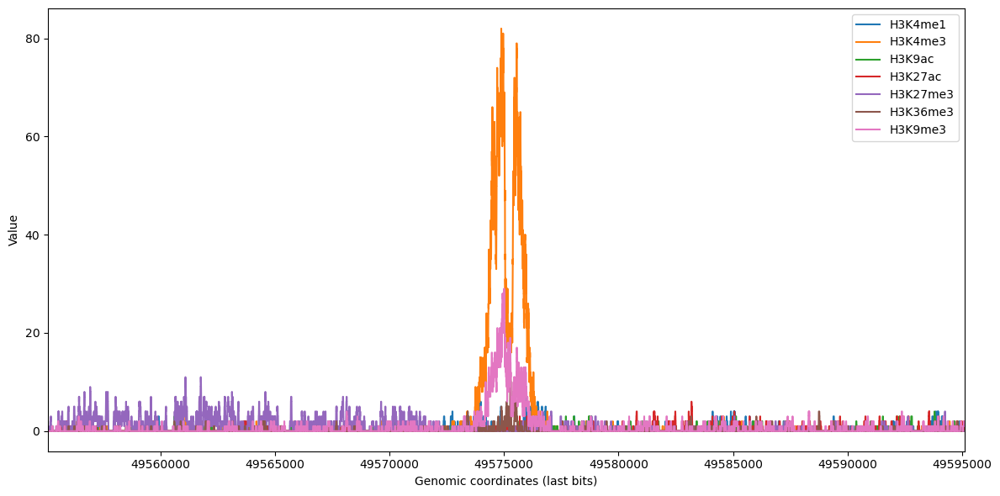

In [3]:
# PUT HERE THE INFORMATION OF THE GENE
gene_id = 'ENSG00000000419'
chrom = 'chr20'
start = 49575101  # posizione di inizio del gene
end = 49575102	    # posizione di fine del gene
strand = '-'     # direzione del gene (negativo)

###############################################################à

start_window = start - 20000
end_window = start + 20000

print(f"Estrazione della finestra genomica per il gene {gene_id}:")
print(f"Coordinate: {chrom}:{start_window}-{end_window} (Strand: {strand})")

file_path = f'D:/E003/{chrom}_{start_window}_{end_window}.npy'

data = np.load(file_path)

########################################################
########################################################
########################################################

num_segments = data.shape[1]
genomic_positions = np.linspace(start_window, end_window, num_segments, dtype=int)

#plot
plt.figure(figsize=(12, 6))
modifiche_istone = ["H3K4me1", "H3K4me3", "H3K9ac", "H3K27ac", "H3K27me3", "H3K36me3", "H3K9me3"]

for i in range(data.shape[0]):  # Per ogni tipo di modifica istonica
    plt.plot(genomic_positions, data[i, :], label=f'{modifiche_istone[i]}')

plt.ticklabel_format(style='plain', axis='x')

xticks = plt.xticks()[0]  # Otteniamo i tick attuali
xtick_labels = [str(int(tick))[-9:] for tick in xticks] 
plt.xticks(xticks, xtick_labels)  
plt.xlabel('Genomic coordinates (last bits)')
plt.ylabel('Value')
plt.xlim(start_window, end_window)
plt.margins(x=0)
plt.tight_layout()
plt.legend()
plt.show()

### Exploratory Analysis

In [3]:
info_data = info_data[info_data["eid"] == cell_line]
info_data 

,gene_id,expression,eid,label,chrom,start,end,strand,split,neighbors,scores
113730,ENSG00000000003,73.205,E066,1,chrX,99891803,99891804,-,4,NaN,NaN
113731,ENSG00000000005,0.191,E066,0,chrX,99839931,99839932,+,4,NaN,NaN
113732,ENSG00000000419,52.609,E066,1,chr20,49575101,49575102,-,3,chr20:49408303-49420667;chr20:49888344-4989237...,2.1737;1.8632;1.5625;1.5287;1.5264
113733,ENSG00000000457,4.733,E066,1,chr1,169863037,169863038,-,1,chr1:169564421-169568978;chr1:171146891-171151...,1.8152;1.7752;1.6062;1.6047;1.5999;1.5656;1.54...
113734,ENSG00000000460,0.942,E066,0,chr1,169764179,169764180,+,1,chr1:168541114-168544308,1.588
...,...,...,...,...,...,...,...,...,...,...,...
132680,ENSG00000259571,0.000,E066,0,chr11,121986923,121986924,-,2,chr11:122025293-122030145;chr11:121779187-1217...,2.0511;1.7963
132681,ENSG00000259642,1.753,E066,0,chr15,80215111,80215112,+,2,chr15:80186281-80193541;chr15:80137692-8014530...,2.765;2.1784;2.0176;1.9768;1.9511;1.9261;1.829...
132682,ENSG00000259658,0.212,E066,0,chr15,102285941,102285942,-,2,chr15:102423746-102428881,1.5297
132683,ENSG00000259664,0.000,E066,0,chr15,98065041,98065042,-,2,NaN,NaN


In [4]:
n_tot = len(info_data)

# label 0 e 1
n_label0 = (info_data["label"] == 0).sum()
n_label1 = (info_data["label"] == 1).sum()

# 
split_counts = info_data["split"].value_counts().sort_index()

print("Number of total observations:", n_tot)
print("Number label 0:", n_label0)
print("Number label 1:", n_label1)
print("\nNumber observations for each split:")
print(split_counts)

Number of total observations: 18955
Number label 0: 9477
Number label 1: 9478

Number observations for each split:
split
1    5045
2    4605
3    4554
4    4751
Name: count, dtype: int64


# Get data and data formatting

In this part of code, we format data ensuring that ensembl gene id is converted in entrez gene id.

Then, we retrieve the coexpression information and we build the coexpression matrix

In [5]:
#we keep the selected cell line
info_data = info_data[info_data["eid"] == cell_line]

In [6]:
info_data.drop(columns=["expression","neighbors","scores"],)

,gene_id,eid,label,chrom,start,end,strand,split
113730,ENSG00000000003,E066,1,chrX,99891803,99891804,-,4
113731,ENSG00000000005,E066,0,chrX,99839931,99839932,+,4
113732,ENSG00000000419,E066,1,chr20,49575101,49575102,-,3
113733,ENSG00000000457,E066,1,chr1,169863037,169863038,-,1
113734,ENSG00000000460,E066,0,chr1,169764179,169764180,+,1
...,...,...,...,...,...,...,...,...
132680,ENSG00000259571,E066,0,chr11,121986923,121986924,-,2
132681,ENSG00000259642,E066,0,chr15,80215111,80215112,+,2
132682,ENSG00000259658,E066,0,chr15,102285941,102285942,-,2
132683,ENSG00000259664,E066,0,chr15,98065041,98065042,-,2


In [38]:
# CONVERSION IN ENTREZ ID 

#MyGene
mg = mygene.MyGeneInfo()

#Ensembl -> Entrez
results = mg.querymany(info_data['gene_id'].tolist(),
                       scopes='ensembl.gene',
                       fields='entrezgene',
                       species='human')

#dictionary to map
ensembl_to_entrez = {item['query']: item.get('entrezgene', None) for item in results}

#store id
info_data = info_data.copy()
info_data['entrez_id'] = info_data['gene_id'].map(ensembl_to_entrez)

#info_data.head()

Input sequence provided is already in string format. No operation performed
Input sequence provided is already in string format. No operation performed
2 input query terms found dup hits:	[('ENSG00000175711', 2), ('ENSG00000257545', 2)]
268 input query terms found no hit:	['ENSG00000005955', 'ENSG00000006074', 'ENSG00000006075', 'ENSG00000006114', 'ENSG00000017373', 'ENS


In [ ]:
# FOR EACH GENE, BUILD THE 3 COEXPRESSED GENES

# results
coexpr_values = []

# for each row of the dataframe
for _, row in info_data.iterrows():
#for _, row in info_data.head(1).iterrows():
    #search for the id and open the file
    entrez_id = str(row['entrez_id'])
    file_path = os.path.join(folder_path, entrez_id)

    if os.path.exists(file_path):
        try:
            # read the file
            df_file = pd.read_csv(file_path, sep="\t", header=None)
            # take from the first colum the top 3 values (genes)
            first_five = df_file.iloc[:3, 0].astype(str).tolist()
            #first_five = df_file.iloc[-3:, 0].astype(str).tolist()
            coexpr_str = ",".join(first_five)
        except Exception as e:
            print(f"Error in file {entrez_id}: {e}")
            coexpr_str = None
    else:
        print(f"File non found for Entrez ID: {entrez_id}")
        coexpr_str = None

    # add result
    coexpr_values.append(coexpr_str)

# update dataframe
info_data.loc[:, 'co-espressione'] = coexpr_values
#info_data.loc[info_data.head(1).index, 'co-espressione'] = coexpr_values

In [ ]:
info_data = info_data.dropna(subset=['co-espressione'])
info_data = info_data.dropna(subset=['entrez_id'])

# Save
#info_data.to_csv('C:/Users/stefa/OneDrive/Desktop/geni_pulito_E003.csv', index=False)
info_data 


In [7]:
#final_df = info_data
final_df = pd.read_csv("C:/Users/stefa/OneDrive/Desktop/geni_pulito_E003.csv") 
# final_df = pd.read_csv("C:/Users/stefa/OneDrive/Desktop/geni_pulito_E066.csv") 
#final_df = pd.read_csv("C:/Users/stefa/OneDrive/Desktop/geni_pulito_E116.csv") 

# build the coexpression matrix between the main gene and its 3 coexpressed genes

In [43]:
modifiche_istone = ["H3K4me1", "H3K4me3", "H3K9ac", "H3K27ac", "H3K27me3", "H3K36me3", "H3K9me3"]

def calcola_correlazione_tra_modifiche(data1, data2):
    return np.corrcoef(data1, data2)[:7, 7:]

def costruisci_matrice_per_gene_principale(gene_row, df_completo, base_path):
    gene_principale = str(gene_row['entrez_id'])
    coexp_ids = [x.strip() for x in str(gene_row['co-espressione']).split(",")]
    tutti_geni = [gene_principale] + coexp_ids  # ordine voluto

    sotto_df = df_completo[df_completo['entrez_id'].astype(str).isin(tutti_geni)].copy()

    if sotto_df.shape[0] < 4:
        print(f"⚠️ Solo {sotto_df.shape[0]} geni trovati per il gruppo {gene_principale}. Skipping.")
        return None, None, None

    sotto_df['entrez_id'] = sotto_df['entrez_id'].astype(str)
    sotto_df = sotto_df.set_index('entrez_id').loc[tutti_geni].reset_index()

    N = sotto_df.shape[0]
    big_matrix = np.zeros((7 * N, 7 * N))
    data_per_gene = {}

    for idx, row in sotto_df.iterrows():
        gene_id = row['gene_id']
        chrom = row['chrom']
        start = int(row['start'])
        strand = row['strand']

        start_window = start - 20000
        end_window = start + 20000
        file_path = f"{base_path}/{chrom}_{start_window}_{end_window}.npy" #for E003 and E066 cell lines
        #file_path = f"{base_path}/{chrom}_{start_window}-{end_window}.npy" #for E116 cell line

        try:
            data = np.load(file_path)
            data_per_gene[gene_id] = data
        except Exception as e:
            print(f"⚠️ Errore caricamento {gene_id}: {e}")
            data_per_gene[gene_id] = None

    gene_ids = sotto_df['gene_id'].tolist()
    gene_labels = sotto_df['label'].tolist()

    for i in range(N):
        for j in range(N):
            data_i = data_per_gene[gene_ids[i]]
            data_j = data_per_gene[gene_ids[j]]
            block = np.full((7, 7), np.nan)

            if data_i is not None and data_j is not None:
                if i == j:
                    block = np.corrcoef(data_i)
                else:
                    block = calcola_correlazione_tra_modifiche(data_i, data_j)

            big_matrix[i*7:(i+1)*7, j*7:(j+1)*7] = block

    return big_matrix, gene_ids, gene_labels

final_df['matrice_correlazioni'] = None

for idx, row in final_df.iterrows():
#for idx, row in final_df.head(50).iterrows():
    output = costruisci_matrice_per_gene_principale(row, final_df, base_path)
    if output[0] is not None:
        matrice, gene_ids, gene_labels = output
        final_df.at[idx, 'matrice_correlazioni'] = matrice.tolist()

final_df

⚠️ Solo 4 geni trovati per il gruppo 8813. Skipping.
⚠️ Solo 3 geni trovati per il gruppo 2729. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 4800. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 81887. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 572. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 4267. Skipping.
⚠️ Solo 3 geni trovati per il gruppo 51384. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 10181. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 10180. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 7982. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 996. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 8935. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 3207. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 3980. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 56928. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 9256. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 84058. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 54677. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 3081

c:\Users\stefa\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\stefa\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


⚠️ Solo 4 geni trovati per il gruppo 5805. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 51232. Skipping.
⚠️ Solo 3 geni trovati per il gruppo 339105. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 23657. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 93589. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 775. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 7068. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 288. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 9231. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 1456. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 129787. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 29087. Skipping.
⚠️ Solo 3 geni trovati per il gruppo 2313. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 2180. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 160857. Skipping.
⚠️ Solo 2 geni trovati per il gruppo 79668. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 80097. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 460. Skipping.
⚠️ Solo 3 geni trovati per il gruppo 

c:\Users\stefa\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\stefa\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


⚠️ Solo 4 geni trovati per il gruppo 6503. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 286097. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 2776. Skipping.
⚠️ Solo 1 geni trovati per il gruppo 83873. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 257. Skipping.
⚠️ Solo 3 geni trovati per il gruppo 123720. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 9073. Skipping.
⚠️ Solo 3 geni trovati per il gruppo 118980. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 8817. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 5097. Skipping.
⚠️ Solo 3 geni trovati per il gruppo 7381. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 51001. Skipping.
⚠️ Solo 1 geni trovati per il gruppo 1915. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 219743. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 4838. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 27020. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 286053. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 7547. Skipping.
⚠️ Solo 4 geni trovati per il grup

c:\Users\stefa\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\stefa\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


⚠️ Solo 4 geni trovati per il gruppo 55181. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 2879. Skipping.
⚠️ Solo 3 geni trovati per il gruppo 126306. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 29123. Skipping.
⚠️ Solo 1 geni trovati per il gruppo 124923. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 147011. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 147015. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 84436. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 55762. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 148137. Skipping.
⚠️ Solo 2 geni trovati per il gruppo 114823. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 148170. Skipping.
⚠️ Solo 3 geni trovati per il gruppo 199713. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 284349. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 1938. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 55311. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 374875. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 3817. Skipping.
⚠️ Solo 4 geni trovat

c:\Users\stefa\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\stefa\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


⚠️ Solo 4 geni trovati per il gruppo 23512. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 200895. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 54913. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 415117. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 57184. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 135932. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 124989. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 81575. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 54512. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 285346. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 79818. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 80010. Skipping.
⚠️ Solo 3 geni trovati per il gruppo 27335. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 114932. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 112574. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 93621. Skipping.
⚠️ Solo 2 geni trovati per il gruppo 84314. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 283849. Skipping.
⚠️ Solo 2 geni trova

c:\Users\stefa\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\stefa\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


⚠️ Solo 3 geni trovati per il gruppo 5575. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 374383. Skipping.
⚠️ Solo 2 geni trovati per il gruppo 390927. Skipping.
⚠️ Solo 1 geni trovati per il gruppo 170622. Skipping.
⚠️ Solo 1 geni trovati per il gruppo 643338. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 285180. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 374918. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 79862. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 374872. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 375341. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 387695. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 343521. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 389792. Skipping.
⚠️ Solo 2 geni trovati per il gruppo 285193. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 388115. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 144535. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 653820. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 340719. Skipping.
⚠️ Solo 4 gen

c:\Users\stefa\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\stefa\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


⚠️ Solo 4 geni trovati per il gruppo 11325. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 7745. Skipping.
⚠️ Solo 3 geni trovati per il gruppo 144717. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 3221. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 7296. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 147949. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 84914. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 388558. Skipping.
⚠️ Solo 1 geni trovati per il gruppo 10230. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 3127. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 7975. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 5350. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 118472. Skipping.
⚠️ Solo 2 geni trovati per il gruppo 283518. Skipping.
⚠️ Solo 3 geni trovati per il gruppo 1500. Skipping.
⚠️ Solo 3 geni trovati per il gruppo 131870. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 11177. Skipping.
⚠️ Solo 4 geni trovati per il gruppo 26112. Skipping.
⚠️ Solo 4 geni trovati per il

,gene_id,expression,eid,label,chrom,start,end,strand,split,neighbors,scores,entrez_id,co-espressione,matrice_correlazioni
0,ENSG00000000003,43.985,E003,1,chrX,99891803,99891804,-,4,NaN,NaN,7105,"27286,27018,1266,6594","[[1.0, 0.03513723680726569, 0.0742609336277012..."
1,ENSG00000000005,1.642,E003,0,chrX,99839931,99839932,+,4,NaN,NaN,64102,"9370,4886,10345,9350","[[1.0, 0.05040096071856981, 0.0071967096891283..."
2,ENSG00000000419,35.259,E003,1,chr20,49575101,49575102,-,3,chr20:49535851-49543243;chr20:50008803-5001218...,2.066;1.7651;1.7292;1.6958;1.6636;1.6353;1.608...,8813,"8520,51639,57129,55854",None
3,ENSG00000000457,2.596,E003,0,chr1,169863037,169863038,-,1,chr1:170616799-170620074;chr1:170575489-170580...,2.0361;1.9965;1.9848;1.9023;1.7961;1.6457;1.60...,57147,"92344,25896,8548,4931","[[1.0, 0.04176952006490753, 0.0662112992632757..."
4,ENSG00000000460,6.649,E003,1,chr1,169764179,169764180,+,1,chr1:169497108-169500425;chr1:169590775-169597...,2.2824;2.1954;2.117;1.735;1.6633;1.5754;1.5662...,55732,"286826,253714,2491,2187","[[1.0, 0.056726018696264716, 0.071251898828843..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18926,ENSG00000258920,1.838,E003,0,chr14,89883696,89883697,+,1,NaN,NaN,400236,"79178,101926888,100507437,284184",None
18928,ENSG00000258947,35.220,E003,1,chr16,89988331,89988332,+,3,chr16:90050224-90062361;chr16:89878245-8989408...,1.9998;1.9619;1.5928;1.5902;1.5399,10381,"4157,7280,79007,114787","[[1.0, 0.25703333895059177, 0.0519725776557458..."
18935,ENSG00000259120,0.000,E003,0,chr17,73642329,73642330,+,4,chr17:73667136-73672961;chr17:73736356-7374105...,3.0704;2.7486;2.5731;2.4227;1.9513;1.8964;1.69...,100130933,"53841,745,10110,440335",None
18936,ENSG00000259207,0.136,E003,0,chr17,45331191,45331192,+,4,chr17:45312503-45316230;chr17:45800534-4581241...,1.6295;1.5416;1.5415;1.5292,3690,"124989,5473,107984360,5196",None


In [ ]:
#final_df = pd.read_csv("C:/Users/stefa/OneDrive/Desktop/geni_matrice_E066.csv") 
#final_df = pd.read_csv("C:/Users/stefa/OneDrive/Desktop/final_df_E116_ultimi_coexp.csv") 

#PLOT THE MATRICES IF YOU WANT TO INVESTIGATE

modifiche_istone = ["H3K4me1", "H3K4me3", "H3K9ac", "H3K27ac", "H3K27me3", "H3K36me3", "H3K9me3"]
def plot_matrice_singola(matrix, gene_entrez_ids, gene_labels, titolo, show_titles="both"):
    """
    gene_entrez_ids: lista degli Entrez ID
    gene_labels:     lista delle label dei geni, stessa lunghezza
    """
    n_geni = len(gene_entrez_ids)
    n_mod  = len(modifiche_istone)
    assert matrix.shape == (n_geni*n_mod, n_geni*n_mod), "Dimensioni inaspettate della matrice"

    tick_labels = modifiche_istone * n_geni

    fig_size = max(10, len(tick_labels) * 0.6)
    fig, ax = plt.subplots(figsize=(fig_size, fig_size))

    sns.heatmap(
        matrix,
        xticklabels=tick_labels,
        yticklabels=tick_labels,
        cmap='RdBu_r',
        center=0,
        square=True,
        cbar_kws={"shrink": 0.5},
        ax=ax
    )


    for i in range(1, n_geni):
        ax.axvline(x=n_mod * i, color='black', linestyle='--', lw=1)
        ax.axhline(y=n_mod * i, color='black', linestyle='--', lw=1)

    ax.set_xticklabels(tick_labels, rotation=90, fontsize=13)
    ax.set_yticklabels(tick_labels, rotation=0, fontsize=13)


    plt.subplots_adjust(top=0.98, left=0.08)

    for i, (entrez, label) in enumerate(zip(gene_entrez_ids, gene_labels)):
        x_center = i * n_mod + n_mod / 2
        y_center = i * n_mod + n_mod / 2

        testo = f"{entrez} ({label})"   # <-- Entrez + Label

        if show_titles in ("x", "both"):
            ax.text(
                x_center, -0.1, testo,     
                transform=ax.get_xaxis_transform(),
                ha='center', va='top',
                fontsize=13, fontweight='bold'
            )

        if show_titles in ("y", "both"):
            ax.text(
                -0.1, y_center, testo,      
                transform=ax.get_yaxis_transform(),
                ha='right', va='center',
                fontsize=13, fontweight='bold', rotation=90
            )

    plt.tight_layout()
    plt.show()

# entrez_id -> label
entrez_to_label = final_df.set_index('entrez_id')['label'].to_dict()

for idx, row in final_df.head(50).iterrows():
    try:
        matrice = ast.literal_eval(row['matrice_correlazioni'])
        matrice_array = np.array(matrice)

        if matrice_array.shape == (28, 28):
            coexp_entrez = [int(e) for e in row['co-espressione'].split(',')]
            all_entrez = [int(row['entrez_id'])] + coexp_entrez

            all_labels = [str(entrez_to_label.get(e, "?")) for e in all_entrez]

            titolo = f"Correlazione - Gene rif.: {row['gene_id']} (Entrez {row['entrez_id']})"

            plot_matrice_singola(matrice_array, all_entrez, all_labels, titolo, show_titles="both")
        else:
            print(f"⚠️ La matrice alla riga {idx} non ha dimensioni 28x28.")
    except Exception as e:
        print(f"Errore nel parsing o nel plot alla riga {idx}: {e}")

In [44]:
final_df = final_df.dropna(subset=['matrice_correlazioni'])

# Salva il dataframe in un file CSV
#final_df.to_csv('C:/Users/stefa/OneDrive/Desktop/geni_matrice_E003.csv', index=False)
final_df 

,gene_id,expression,eid,label,chrom,start,end,strand,split,neighbors,scores,entrez_id,co-espressione,matrice_correlazioni
0,ENSG00000000003,43.985,E003,1,chrX,99891803,99891804,-,4,NaN,NaN,7105,"27286,27018,1266,6594","[[1.0, 0.03513723680726569, 0.0742609336277012..."
1,ENSG00000000005,1.642,E003,0,chrX,99839931,99839932,+,4,NaN,NaN,64102,"9370,4886,10345,9350","[[1.0, 0.05040096071856981, 0.0071967096891283..."
3,ENSG00000000457,2.596,E003,0,chr1,169863037,169863038,-,1,chr1:170616799-170620074;chr1:170575489-170580...,2.0361;1.9965;1.9848;1.9023;1.7961;1.6457;1.60...,57147,"92344,25896,8548,4931","[[1.0, 0.04176952006490753, 0.0662112992632757..."
4,ENSG00000000460,6.649,E003,1,chr1,169764179,169764180,+,1,chr1:169497108-169500425;chr1:169590775-169597...,2.2824;2.1954;2.117;1.735;1.6633;1.5754;1.5662...,55732,"286826,253714,2491,2187","[[1.0, 0.056726018696264716, 0.071251898828843..."
5,ENSG00000000938,0.211,E003,0,chr1,27953108,27953109,-,1,chr1:27383252-27390061;chr1:27744472-27751372;...,3.1312;2.0996;1.9588;1.7071;1.6856;1.6684;1.62...,2268,"3101,3687,10288,3684","[[1.0, 0.16780879690824915, 0.1521423194150712..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18898,ENSG00000258227,0.000,E003,0,chr7,141646774,141646775,-,2,chr7:141947307-141954956;chr7:141662815-141667...,1.9434;1.9357;1.821;1.7547;1.7044;1.6494;1.566...,23601,"53831,338339,199675,6036","[[1.0, 0.09730654205991898, 0.0155191469310704..."
18904,ENSG00000258366,6.877,E003,1,chr20,62289663,62289664,+,3,chr20:62568659-62574813;chr20:62349997-6235960...,3.0814;2.2034;2.1391;1.9303;1.8686;1.8104;1.75...,51750,"63922,10139,197335,54991","[[1.0, 0.15824769769083946, 0.0979454531268791..."
18909,ENSG00000258484,0.000,E003,0,chr15,69222862,69222863,+,2,chr15:69014632-69021094;chr15:68992143-6899530...,3.0465;2.1035;2.0801;1.902;1.8818;1.8624;1.737...,246777,"55510,222698,100506243,150763","[[1.0, 0.08728960179179511, 0.0918807392683419..."
18925,ENSG00000258890,25.665,E003,1,chr17,62503093,62503094,+,4,chr17:62471061-62475206;chr17:62475207-6247940...,1.9551;1.8663;1.8656;1.8392;1.8387;1.7332;1.67...,90799,"11011,23360,57602,11325","[[1.0, 0.014196565025017191, 0.031516241543097..."


# peaks features extraction

In [45]:
#final_df = pd.read_csv("C:/Users/stefa/OneDrive/Desktop/geni_pulito_E116.csv") 
final_df

,gene_id,expression,eid,label,chrom,start,end,strand,split,neighbors,scores,entrez_id,co-espressione,matrice_correlazioni
0,ENSG00000000003,43.985,E003,1,chrX,99891803,99891804,-,4,NaN,NaN,7105,"27286,27018,1266,6594","[[1.0, 0.03513723680726569, 0.0742609336277012..."
1,ENSG00000000005,1.642,E003,0,chrX,99839931,99839932,+,4,NaN,NaN,64102,"9370,4886,10345,9350","[[1.0, 0.05040096071856981, 0.0071967096891283..."
3,ENSG00000000457,2.596,E003,0,chr1,169863037,169863038,-,1,chr1:170616799-170620074;chr1:170575489-170580...,2.0361;1.9965;1.9848;1.9023;1.7961;1.6457;1.60...,57147,"92344,25896,8548,4931","[[1.0, 0.04176952006490753, 0.0662112992632757..."
4,ENSG00000000460,6.649,E003,1,chr1,169764179,169764180,+,1,chr1:169497108-169500425;chr1:169590775-169597...,2.2824;2.1954;2.117;1.735;1.6633;1.5754;1.5662...,55732,"286826,253714,2491,2187","[[1.0, 0.056726018696264716, 0.071251898828843..."
5,ENSG00000000938,0.211,E003,0,chr1,27953108,27953109,-,1,chr1:27383252-27390061;chr1:27744472-27751372;...,3.1312;2.0996;1.9588;1.7071;1.6856;1.6684;1.62...,2268,"3101,3687,10288,3684","[[1.0, 0.16780879690824915, 0.1521423194150712..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18898,ENSG00000258227,0.000,E003,0,chr7,141646774,141646775,-,2,chr7:141947307-141954956;chr7:141662815-141667...,1.9434;1.9357;1.821;1.7547;1.7044;1.6494;1.566...,23601,"53831,338339,199675,6036","[[1.0, 0.09730654205991898, 0.0155191469310704..."
18904,ENSG00000258366,6.877,E003,1,chr20,62289663,62289664,+,3,chr20:62568659-62574813;chr20:62349997-6235960...,3.0814;2.2034;2.1391;1.9303;1.8686;1.8104;1.75...,51750,"63922,10139,197335,54991","[[1.0, 0.15824769769083946, 0.0979454531268791..."
18909,ENSG00000258484,0.000,E003,0,chr15,69222862,69222863,+,2,chr15:69014632-69021094;chr15:68992143-6899530...,3.0465;2.1035;2.0801;1.902;1.8818;1.8624;1.737...,246777,"55510,222698,100506243,150763","[[1.0, 0.08728960179179511, 0.0918807392683419..."
18925,ENSG00000258890,25.665,E003,1,chr17,62503093,62503094,+,4,chr17:62471061-62475206;chr17:62475207-6247940...,1.9551;1.8663;1.8656;1.8392;1.8387;1.7332;1.67...,90799,"11011,23360,57602,11325","[[1.0, 0.014196565025017191, 0.031516241543097..."


In [46]:
# CNN
class SignalEncoder(nn.Module):
    def __init__(self, output_dim=100):
        super(SignalEncoder, self).__init__()
        self.encoder = nn.Sequential(
            nn.Conv1d(1, 16, kernel_size=50, stride=10),
            nn.ReLU(),
            nn.Conv1d(16, 32, kernel_size=10, stride=5),
            nn.ReLU(),
            nn.AdaptiveAvgPool1d(10),
            nn.Flatten(),
            nn.Linear(32 * 10, output_dim)
        )

    def forward(self, x):
        return self.encoder(x)  # Output: (batch, output_dim)

histone_marks = ["H3K4me1", "H3K4me3", "H3K9ac", "H3K27ac", "H3K27me3", "H3K36me3", "H3K9me3"]


def load_histone_data(row):
    chrom = row['chrom']
    start = int(row['start'])
    strand = row['strand']
    start_window = start - 20000
    end_window = start + 20000
    file_path = f"{base_path}/{chrom}_{start_window}_{end_window}.npy"
    #file_path = f"{base_path}/{chrom}_{start_window}-{end_window}.npy"

    try:
        data = np.load(file_path)
        if strand == "-":
            data = np.flip(data, axis=1).copy()
        return data
    except Exception as e:
        print(f"⚠️ Errore caricando {file_path}: {e}")
        return None

encoder = SignalEncoder(output_dim=100)
encoder.eval()  

node_names = []
feature_vectors = []

all_gene_ids = set(final_df["entrez_id"].astype(str))
for coexpr in final_df["co-espressione"]:
    if pd.isna(coexpr):
        continue
    co_genes = [g.strip() for g in coexpr.split(",")]
    all_gene_ids.update(co_genes)

print(f"Totale geni unici: {len(all_gene_ids)}")

# for each gene
for gene_id in tqdm(list(all_gene_ids), desc="Processing genes"):
    rows = final_df[final_df["entrez_id"].astype(str) == gene_id]  

    gene_feature_vector = []  

    for _, row in rows.iterrows():
        histone_matrix = load_histone_data(row)

        if histone_matrix is not None:
            tensor = torch.tensor(histone_matrix, dtype=torch.float32).unsqueeze(1)  # (7, 1, 40000)
            with torch.no_grad():
                embedding_matrix = encoder(tensor)  # (7, 100)

            for i in range(len(histone_marks)):
                feature_vector = embedding_matrix[i].numpy().tolist()
                gene_feature_vector.extend(feature_vector)  # concatenation

    node_name = f"{gene_id}_aggregate"
    node_names.append(node_name)
    feature_vectors.append(gene_feature_vector)

# final dataframe
features_df = pd.DataFrame(feature_vectors)
features_df.insert(0, "node", node_names)

column_names = ["node"]
for mark in histone_marks:
    for i in range(100):
        column_names.append(f"{mark}_f{i}")
features_df.columns = column_names

#features_df.to_csv("features_epigenetiche_per_gene_E116.csv", index=False)

Totale geni unici: 13478


Processing genes: 100%|██████████| 13478/13478 [09:52<00:00, 22.74it/s]


In [17]:
features_df.to_csv("features_epigenetiche_per_gene_E003.csv", index=False)

In [3]:
df = pd.read_csv("C:/Users/stefa/OneDrive/Desktop/geni_matrice.csv") 
#df = pd.read_csv("C:/Users/stefa/OneDrive/Desktop/geni_matrice_E066.csv") 
#df = pd.read_csv("C:/Users/stefa/OneDrive/Desktop/geni_matrice_E116.csv") 


df['expression'] = df['expression'].round().astype(int)

features_df = pd.read_csv("features_epigenetiche_per_gene.csv")
#features_df = pd.read_csv("features_epigenetiche_per_gene_E066.csv")
#features_df = pd.read_csv("features_epigenetiche_per_gene_E116.csv")
features_df

,node,gene_type,H3K4me1_f0,H3K4me1_f1,H3K4me1_f2,H3K4me1_f3,H3K4me1_f4,H3K4me1_f5,H3K4me1_f6,H3K4me1_f7,...,H3K9me3_f90,H3K9me3_f91,H3K9me3_f92,H3K9me3_f93,H3K9me3_f94,H3K9me3_f95,H3K9me3_f96,H3K9me3_f97,H3K9me3_f98,H3K9me3_f99
0,27286,co-expressed,-0.079440,0.089178,-0.084707,0.071066,-0.033926,0.056653,-0.095329,-0.002077,...,0.223780,0.047975,-0.091142,-0.021581,-0.065496,-0.216318,0.006111,0.109385,0.007221,0.042114
1,7105,main,-0.077425,0.035563,-0.075661,0.017960,-0.050275,0.070010,-0.119184,0.003596,...,0.096893,-0.138565,-0.219266,0.149191,0.029670,-0.189808,-0.027112,0.130762,-0.065570,0.106253
2,1266,co-expressed,-0.149155,0.143370,-0.125348,0.017255,0.044921,0.035654,-0.451051,-0.132123,...,0.175289,-0.462186,-0.446254,0.354082,-0.069563,-0.516342,-0.100647,0.153623,-0.108377,0.298764
3,27018,co-expressed,-0.099207,0.058637,-0.060810,0.014431,-0.034697,0.028557,-0.099090,0.001079,...,0.122715,-0.063326,-0.172531,0.085976,0.033317,-0.114747,-0.022276,0.167155,-0.048773,0.100348
4,4886,co-expressed,-0.103617,0.064496,-0.051016,0.025089,-0.041889,0.024492,-0.099666,0.026464,...,0.185825,-0.041064,-0.164430,0.080081,-0.045825,-0.232819,-0.050230,0.120589,0.023655,0.093377
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13431,51174,co-expressed,-0.094645,0.074262,-0.063492,0.030053,-0.028941,0.023321,-0.092151,0.004214,...,0.171928,-0.030058,-0.169699,0.101775,-0.036879,-0.253075,-0.092571,0.048491,0.039677,0.004707
13432,5222,main,-0.041259,0.066413,-0.034512,0.040231,-0.038604,0.027626,-0.094155,-0.000218,...,0.142531,0.048780,-0.107439,0.026139,0.013423,-0.124671,-0.027678,0.057335,0.040614,-0.073734
13433,154288,co-expressed,-0.091746,-0.065662,-0.124170,0.074627,-0.075080,0.141151,-0.309071,-0.000592,...,0.193059,0.059226,-0.151491,0.019695,-0.001610,-0.162455,-0.050077,0.139834,0.059116,-0.015958
13434,100129128,main,-0.083049,0.080254,-0.080037,0.021812,-0.010977,0.038130,-0.089633,-0.018537,...,0.172559,0.029716,-0.138319,0.023690,0.005412,-0.167141,-0.047191,0.111668,0.030633,-0.020513


In [ ]:
# USE ONLY FOR E116

# Rinominare la colonna
#features_df = features_df.rename(columns={"node": "entrez_id"})

# Convertire in stringa e rimuovere "_aggregate"
#features_df["entrez_id"] = features_df["entrez_id"].astype(str).str.replace("_aggregate", "", regex=False)
#features_df

In [47]:
features_df['entrez_id'] = features_df['node'].astype(str)
features_df['entrez_id'] = features_df['entrez_id'].str.replace('_aggregate', '', regex=False)


df_unique = df.drop_duplicates(subset='entrez_id').copy()

In [48]:
df_unique['entrez_id'] = df_unique['entrez_id'].astype(str)

In [49]:
merged_df = pd.merge(df_unique, features_df, on='entrez_id', how='inner')
merged_df

,gene_id,expression,eid,label,chrom,start,end,strand,split,neighbors,...,H3K9me3_f90,H3K9me3_f91,H3K9me3_f92,H3K9me3_f93,H3K9me3_f94,H3K9me3_f95,H3K9me3_f96,H3K9me3_f97,H3K9me3_f98,H3K9me3_f99
0,ENSG00000000003,43.985,E003,1,chrX,99891803,99891804,-,4,NaN,...,0.057799,0.074950,-0.016565,0.027971,-0.018424,-0.065968,0.052655,0.106922,-0.070900,0.000814
1,ENSG00000000005,1.642,E003,0,chrX,99839931,99839932,+,4,NaN,...,0.011264,0.026225,-0.016590,0.045894,-0.047573,-0.002043,0.025044,0.086687,0.004520,-0.015730
2,ENSG00000000457,2.596,E003,0,chr1,169863037,169863038,-,1,chr1:170616799-170620074;chr1:170575489-170580...,...,0.077063,0.057658,-0.119264,0.077704,-0.043672,-0.043999,0.065929,0.190048,0.070633,-0.021943
3,ENSG00000000460,6.649,E003,1,chr1,169764179,169764180,+,1,chr1:169497108-169500425;chr1:169590775-169597...,...,0.072532,0.076400,-0.104668,0.067794,-0.032598,-0.059874,0.066624,0.177164,0.007615,-0.011765
4,ENSG00000000938,0.211,E003,0,chr1,27953108,27953109,-,1,chr1:27383252-27390061;chr1:27744472-27751372;...,...,-0.017099,0.128699,-0.025862,0.063042,-0.054244,0.032940,-0.004721,0.081801,-0.002877,-0.038972
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11718,ENSG00000258484,0.000,E003,0,chr15,69222862,69222863,+,2,chr15:69014632-69021094;chr15:68992143-6899530...,...,0.020917,0.056956,-0.021528,0.038459,-0.050537,0.019147,0.017360,0.080409,-0.010171,-0.025074
11719,ENSG00000258818,2.271,E003,0,chr14,21152717,21152718,+,1,chr14:21127322-21131085;chr14:21089191-2109805...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
11720,ENSG00000258839,1.377,E003,0,chr16,89985268,89985269,+,3,chr16:90050224-90062361;chr16:89878245-8989408...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
11721,ENSG00000258890,25.665,E003,1,chr17,62503093,62503094,+,4,chr17:62471061-62475206;chr17:62475207-6247940...,...,0.186041,0.027270,-0.282949,0.160000,-0.058527,-0.088809,0.258666,0.389307,0.270527,-0.035495


In [50]:
final_df = merged_df

# Classification - XGBoost

In [51]:
X = []
y = []
splits = []

histone_cols = [col for col in final_df.columns if any(mark in col for mark in [
    "H3K4me1", "H3K4me3", "H3K9ac", "H3K27ac", "H3K27me3", "H3K36me3", "H3K9me3"
])]

for idx, row in final_df.iterrows():
    raw_matrix = row['matrice_correlazioni']

    try:
        # Parsing matrice
        if isinstance(raw_matrix, str):
            matrice = ast.literal_eval(raw_matrix)
        elif isinstance(raw_matrix, list):
            matrice = raw_matrix
        else:
            continue

        if not (isinstance(matrice, list) and all(isinstance(r, list) for r in matrice)):
            continue

        # Flatten matrix
        matrice_flattened = np.array(matrice).flatten()

        histone_features = row.loc[histone_cols].astype(float).values

        # Concatenation
        features = np.concatenate([matrice_flattened, histone_features])

        X.append(features)
        y.append(row['label'])
        splits.append(row['split'])

    except Exception as e:
        print(f"⚠️ Errore alla riga {idx}: {e}")
        continue

X = np.array(X)
y = np.array(y)
splits = np.array(splits)

⚠️ Errore alla riga 872: malformed node or string on line 1: <ast.Name object at 0x00000239ECB524D0>
⚠️ Errore alla riga 1963: malformed node or string on line 1: <ast.Name object at 0x00000239ECB662D0>
⚠️ Errore alla riga 6933: malformed node or string on line 1: <ast.Name object at 0x00000239E917A690>
⚠️ Errore alla riga 8371: malformed node or string on line 1: <ast.Name object at 0x00000239549340D0>
⚠️ Errore alla riga 9670: malformed node or string on line 1: <ast.Name object at 0x00000239E9155E50>
⚠️ Errore alla riga 10971: malformed node or string on line 1: <ast.Name object at 0x00000239ECB1E0D0>


In [ ]:
X = []
y = []
splits = []

histone_cols = [col for col in final_df.columns if any(mark in col for mark in [
    "H3K4me1", "H3K4me3", "H3K9ac", "H3K27ac", "H3K27me3", "H3K36me3", "H3K9me3"
])]

def get_histone_features(entrez_id):
    row_feat = features_df[features_df['entrez_id'] == entrez_id]
    if row_feat.empty:
        return None
    return row_feat[histone_cols].values.flatten()

for idx, row in final_df.iterrows():
    raw_matrix = row['matrice_correlazioni']

    try:
       
        if isinstance(raw_matrix, str):
            matrice = ast.literal_eval(raw_matrix)
        elif isinstance(raw_matrix, list):
            matrice = raw_matrix
        else:
            continue

        if not (isinstance(matrice, list) and all(isinstance(r, list) for r in matrice)):
            continue

        
        matrice_flattened = np.array(matrice).flatten()

       
        gene_feature_vectors = []

        # main gene
        main_id = str(row['entrez_id'])
        main_feats = get_histone_features(main_id)
        if main_feats is not None:
            gene_feature_vectors.append(main_feats)

        # coexpressed genes
        coexpr = row.get('co-espressione', '')
        if isinstance(coexpr, str):
            for g in coexpr.split(','):
                g = g.strip()
                if not g:
                    continue
                co_feats = get_histone_features(g)
                if co_feats is not None:
                    gene_feature_vectors.append(co_feats)

        if not gene_feature_vectors:
            continue

        histone_features = np.concatenate(gene_feature_vectors)

        features = np.concatenate([matrice_flattened, histone_features])
        
        X.append(features)
        y.append(row['label'])
        splits.append(row['split'])

    except Exception as e:
        print(f"⚠️ Errore alla riga {idx}: {e}")
        continue

X = np.array(X)
y = np.array(y)
splits = np.array(splits)

In [ ]:
X.shape

In [11]:
# XGBoost classifier definition
xgb_clf = XGBClassifier(
    n_estimators=500, 
    max_depth=5,
    eval_metric='logloss',
    random_state=42
)

# Cross-Validation
xgb_scores = []
xgb_auc_scores = []
xgb_precision_scores = []
xgb_recall_scores = []
xgb_f1_scores = []

for fold in range(1, 5):
    test_idx = np.where(splits == fold)[0]
    train_idx = np.where(splits != fold)[0]
    
    X_train, X_test = X[train_idx], X[test_idx]
    y_train, y_test = y[train_idx], y[test_idx]
    
    xgb_clf.fit(X_train, y_train)
    y_pred = xgb_clf.predict(X_test)
    y_prob = xgb_clf.predict_proba(X_test)
    
    # Accuracy
    acc = accuracy_score(y_test, y_pred)
    xgb_scores.append(acc)
    
    # AUC score
    if len(np.unique(y)) == 2:
        auc = roc_auc_score(y_test, y_prob[:, 1])
    else:
        auc = roc_auc_score(y_test, y_prob, multi_class='ovr')
    xgb_auc_scores.append(auc)
    
    # Precision
    precision = precision_score(y_test, y_pred, average='binary' if len(np.unique(y)) == 2 else 'macro')
    xgb_precision_scores.append(precision)
    
    # Recall
    recall = recall_score(y_test, y_pred, average='binary' if len(np.unique(y)) == 2 else 'macro')
    xgb_recall_scores.append(recall)
    
    # F1 Score
    f1 = f1_score(y_test, y_pred, average='binary' if len(np.unique(y)) == 2 else 'macro')
    xgb_f1_scores.append(f1)

# Print the results
print("XGBoost Cross-Validation Accuracy Scores:", xgb_scores)
print("XGBoost Mean Accuracy:", np.mean(xgb_scores))

print("XGBoost Cross-Validation AUC Scores:", xgb_auc_scores)
print("XGBoost Mean AUC:", np.mean(xgb_auc_scores))

print("XGBoost Cross-Validation Precision Scores:", xgb_precision_scores)
print("XGBoost Mean Precision:", np.mean(xgb_precision_scores))

print("XGBoost Cross-Validation Recall Scores:", xgb_recall_scores)
print("XGBoost Mean Recall:", np.mean(xgb_recall_scores))

print("XGBoost Cross-Validation F1 Scores:", xgb_f1_scores)
print("XGBoost Mean F1:", np.mean(xgb_f1_scores))

XGBoost Cross-Validation Accuracy Scores: [0.8715452261306532, 0.8777777777777778, 0.8669600541638456, 0.8396259092483547]
XGBoost Mean Accuracy: 0.8639772418301578
XGBoost Cross-Validation AUC Scores: [0.9359184447179748, 0.9425926641105155, 0.930175691663345, 0.9138272019715961]
XGBoost Mean AUC: 0.9306285006158579
XGBoost Cross-Validation Precision Scores: [0.8706730769230769, 0.8775956284153006, 0.8833865814696485, 0.8885316184351554]
XGBoost Mean Precision: 0.8800467263107954
XGBoost Cross-Validation Recall Scores: [0.9282419272168119, 0.9320951828206616, 0.9050736497545008, 0.8667015159435442]
XGBoost Mean Recall: 0.9080280689338797
XGBoost Cross-Validation F1 Scores: [0.8985363433391218, 0.9040247678018576, 0.8940986257073565, 0.8774808150304313]
XGBoost Mean F1: 0.8935351379696919


## T-test

In [53]:
#final_df = pd.read_csv("C:/Users/stefa/OneDrive/Desktop/geni_matrice.csv") 
#final_df = pd.read_csv("C:/Users/stefa/OneDrive/Desktop/geni_matrice_E066.csv") 
final_df = pd.read_csv("C:/Users/stefa/OneDrive/Desktop/geni_matrice_E116.csv") 


#final_df = pd.read_csv("geni_matrice_E003_last_coespressed.csv") 
final_df.head()
df = final_df

In [54]:
import numpy as np
import pandas as pd
import ast
import re
from scipy.io import savemat

def parse_mat_safe(x):
    # ritorna np.array se ok, altrimenti None
    if x is None or (isinstance(x, float) and np.isnan(x)):
        return None

    # se è già lista/array
    if isinstance(x, (list, tuple, np.ndarray)):
        try:
            a = np.array(x, dtype=np.float32)
            return a if a.ndim == 2 else None
        except Exception:
            return None

    if not isinstance(x, str):
        return None

    s = x.strip()

    # normalizza token comuni che rompono literal_eval
    # (nan/NaN/None/inf/-inf) -> float('nan') ecc.
    # così literal_eval resta "safe"
    s = re.sub(r'\bNaN\b|\bnan\b', "float('nan')", s)
    s = re.sub(r'\bNone\b', "float('nan')", s)
    s = re.sub(r'\binf\b', "float('inf')", s)
    s = re.sub(r'\b-Infinity\b|\b-inf\b|\b-Infinity\b', "float('-inf')", s)
    s = re.sub(r'\bInfinity\b', "float('inf')", s)

    try:
        obj = ast.literal_eval(s)
        a = np.array(obj, dtype=np.float32)
        if a.ndim != 2:
            return None
        return a
    except Exception:
        return None

# 1) prova a parsare tutte
parsed = df["matrice_correlazioni"].apply(parse_mat_safe)

# 2) tieni solo quelle OK
ok_mask = parsed.notna()
df_ok = df.loc[ok_mask].copy()

mats = parsed.loc[ok_mask].tolist()

# 3) (opzionale) scarta anche matrici con shape diversa dalla più comune
shapes = pd.Series([m.shape for m in mats])
common_shape = shapes.value_counts().idxmax()

shape_mask = shapes.apply(lambda sh: sh == common_shape).to_numpy()
df_ok = df_ok.iloc[shape_mask].copy()
mats = [m for m, keep in zip(mats, shape_mask) if keep]

# 4) costruisci X e y
X = np.stack(mats, axis=2)  # N x N x M
y = df_ok["label"].to_numpy(dtype=np.int64).reshape(-1, 1)

print("Usate righe:", len(df_ok), " / ", len(df))
print("Shape tensore X:", X.shape, "Shape y:", y.shape)

# 5) salva .mat
savemat("dataset_corr.mat", {"X": X, "y": y})

Usate righe: 11808  /  11815
Shape tensore X: (28, 28, 11808) Shape y: (11808, 1)


In [55]:
# take label and matrix
X = []
labels = []

for _, row in final_df.iterrows():
    try:
        matrice = ast.literal_eval(row['matrice_correlazioni'])
        if isinstance(matrice, list) and all(isinstance(r, list) for r in matrice):
            arr = np.array(matrice)
            if arr.shape == (28, 28):
                X.append(arr)
                labels.append(row['label'])
    except:
        continue

X = np.array(X)
labels = np.array(labels)

# check
if X.ndim != 3 or X.shape[0] < 2 or len(np.unique(labels)) < 2:
    raise ValueError("Dati insufficienti o malformati")

# group division
group0 = X[labels == 0]
group1 = X[labels == 1]

# T-test 
t_stats = np.zeros((28, 28))
p_values = np.ones((28, 28))

for i in range(28):
    for j in range(28):
        if i == j:
            continue  
        try:
            vals0 = group0[:, i, j]
            vals1 = group1[:, i, j]
            stat, p = ttest_ind(vals0, vals1, equal_var=False)
            t_stats[i, j] = stat
            p_values[i, j] = p
        except:
            continue

# FDR
p_flat = p_values.flatten()
_, p_adj_flat, _, _ = multipletests(p_flat, method='fdr_bh')
p_adj = p_adj_flat.reshape(28, 28)

for i in range(28):
    p_adj[i, i] = np.nan

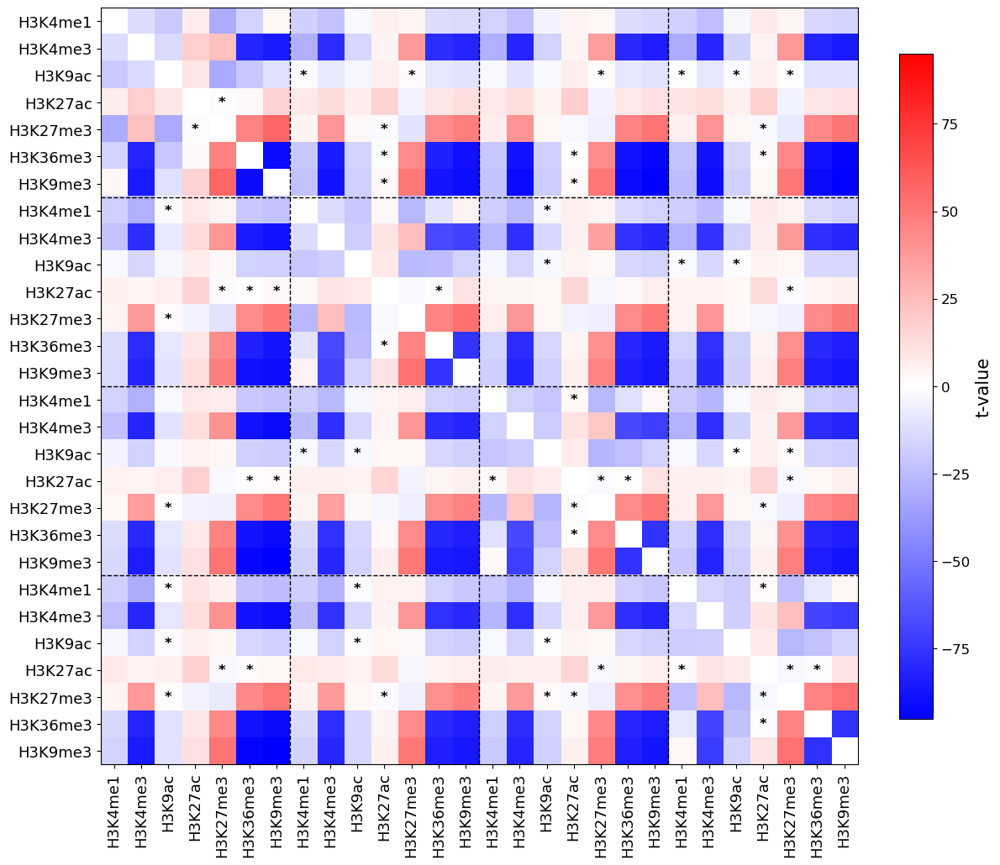

In [56]:
# 1) Diagonal NaN
np.fill_diagonal(t_stats, np.nan)

# 2) Normalization
abs_max = np.nanmax(np.abs(t_stats))
norm = TwoSlopeNorm(vmin=-abs_max, vcenter=0, vmax=abs_max)

# 3) Colormap
custom_cmap = LinearSegmentedColormap.from_list(
    "custom_red_white_blue", ["blue", "white", "red"]
)

# 4) 
modifiche_istone = ["H3K4me1", "H3K4me3", "H3K9ac",
                    "H3K27ac", "H3K27me3", "H3K36me3", "H3K9me3"]
n_mod = len(modifiche_istone)
n_geni = 28 // n_mod
tick_labels = modifiche_istone * n_geni  # 7 etichette ripetute 4 volte

# 5) Plot
fig, ax = plt.subplots(figsize=(12, 12))  # grande per leggere bene le label
im = ax.imshow(t_stats, cmap=custom_cmap, norm=norm)

cbar = plt.colorbar(im, ax=ax, fraction=0.04, shrink=0.8, pad=0.05)
cbar.set_label('t-value', fontsize=15)
cbar.ax.tick_params(labelsize=12)
ax.set_xticks(range(28))
ax.set_yticks(range(28))
ax.set_xticklabels(tick_labels, rotation=90, fontsize=13)
ax.set_yticklabels(tick_labels, rotation=0, fontsize=13)

for i in range(28):
    for j in range(28):
        if i != j and p_adj[i, j] >= 0.01:
            ax.text(j, i, '*', ha='center', va='center',
                    color='black', fontsize=12, fontweight='bold') # * put on > 0.01. modify here if you wish to change it

for k in range(1, n_geni):
    ax.axvline(x=n_mod * k - 0.5, color='black', linestyle='--', lw=1)
    ax.axhline(y=n_mod * k - 0.5, color='black', linestyle='--', lw=1)

plt.tight_layout()
plt.show()

### permutation test

In [ ]:
N_PERM = 1000
rng = np.random.default_rng(42)

iu = np.triu_indices(28, k=1)

obs_mean = np.nanmean(np.abs(t_stats[iu]))

# null distribution
null_mean = np.empty(N_PERM)

for b in range(N_PERM):
    perm = rng.permutation(labels)
    gp0 = X[perm == 0]
    gp1 = X[perm == 1]

    t_vals = []
    for i, j in zip(*iu):
        vals0 = gp0[:, i, j]
        vals1 = gp1[:, i, j]
        tt, _ = ttest_ind(vals0, vals1, equal_var=False)
        t_vals.append(abs(tt))

    null_mean[b] = np.nanmean(t_vals)

# p-value 
p_val = (1 + np.sum(null_mean >= obs_mean)) / (N_PERM + 1)
print(f"Permutation p-value (mean|t|) = {p_val:.4g}")

#plot
plt.figure(figsize=(7,5))
plt.hist(null_mean, bins=40, color='lightgray', edgecolor='black')
plt.axvline(obs_mean, color='red', lw=2, ls='--',
            label=f'Observed = {obs_mean:.3f}  (p = {p_val:.2g})')
q95 = np.quantile(null_mean, 0.95)
plt.axvline(q95, color='blue', ls=':',
            label=f'95% thr = {q95:.3f}')
plt.xlabel('mean |t| under permutation', fontsize=13)
plt.ylabel('Frequency', fontsize=13)
# ingrandire i tick
plt.xticks(fontsize=11)
plt.yticks(fontsize=11)
# ingrandire la legenda
plt.legend(fontsize=11)
plt.tight_layout()
plt.show()

# Further Test

In [58]:
# ============================================================
# STRONG-PRODUCT APPROXIMATION RESIDUAL (H0 vs H1)
# Complete inter-layer graph assumption
# ============================================================

import numpy as np
import pandas as pd
import ast
import re
from scipy.stats import ttest_ind, mannwhitneyu

# ------------------------------------------------------------
# Safe parser for stored matrices
# ------------------------------------------------------------
def parse_mat_safe(x):
    """
    Parse a stored matrix into a 2D numpy array.
    Returns None if parsing fails.
    """
    if x is None:
        return None

    if isinstance(x, float) and np.isnan(x):
        return None

    if isinstance(x, np.ndarray):
        return x.astype(np.float64) if x.ndim == 2 else None

    if isinstance(x, (list, tuple)):
        try:
            arr = np.array(x, dtype=np.float64)
            return arr if arr.ndim == 2 else None
        except Exception:
            return None

    if not isinstance(x, str):
        return None

    s = x.strip()
    if len(s) == 0:
        return None

    # Replace invalid textual tokens with valid Python literals
    s = re.sub(r'\bNaN\b|\bnan\b', 'None', s)
    s = re.sub(r'\bInfinity\b|\binf\b', '1e309', s)
    s = re.sub(r'\b-Infinity\b|\b-inf\b', '-1e309', s)

    try:
        obj = ast.literal_eval(s)
        arr = np.array(obj, dtype=np.float64)
        return arr if arr.ndim == 2 else None
    except Exception:
        return None


# ------------------------------------------------------------
# Utilities
# ------------------------------------------------------------
def block_view(A, n_layers=4, n_marks=7):
    """
    Split A into an n_layers x n_layers grid of n_marks x n_marks blocks.
    Returns a nested list blocks[u][v].
    """
    blocks = []
    for u in range(n_layers):
        row_blocks = []
        ru = slice(u * n_marks, (u + 1) * n_marks)
        for v in range(n_layers):
            cv = slice(v * n_marks, (v + 1) * n_marks)
            row_blocks.append(A[ru, cv])
        blocks.append(row_blocks)
    return blocks


# ------------------------------------------------------------
# Best strong-product approximation with complete inter-layer graph
# ------------------------------------------------------------
def best_strong_product_complete(A, n_layers=4, n_marks=7, symmetrize=True, zero_diag=False):
    """
    Compute the best Frobenius least-squares strong-product approximation
    under the assumption that the inter-layer graph is complete.

    Model:
        A_SP = A_L ⊗ I_M + I_L ⊗ A_M + A_L ⊗ A_M
    with:
        A_L = J - I    (complete graph over layers)

    Therefore:
        diagonal blocks     = A_M
        off-diagonal blocks = I_M + A_M

    Parameters
    ----------
    A : ndarray, shape (n_layers*n_marks, n_layers*n_marks)
        Observed adjacency matrix.
    n_layers : int
        Number of graph layers (genes).
    n_marks : int
        Number of nodes per layer (histone marks).
    symmetrize : bool
        If True, replace A with (A + A.T)/2.
    zero_diag : bool
        If True, force the diagonal of both A and A_M_hat to zero.

    Returns
    -------
    result : dict with keys
        - A_input
        - A_sp
        - A_M_hat
        - residual_matrix
        - abs_residual
        - rel_residual
    """
    A = np.asarray(A, dtype=np.float64)

    expected_shape = (n_layers * n_marks, n_layers * n_marks)
    if A.shape != expected_shape:
        raise ValueError(f"Expected shape {expected_shape}, got {A.shape}")

    A = A.copy()

    if symmetrize:
        A = 0.5 * (A + A.T)

    if zero_diag:
        np.fill_diagonal(A, 0.0)

    I_M = np.eye(n_marks)

    blocks = block_view(A, n_layers=n_layers, n_marks=n_marks)

    diag_blocks = []
    off_blocks_minus_I = []

    for u in range(n_layers):
        for v in range(n_layers):
            B = blocks[u][v]
            if u == v:
                diag_blocks.append(B)
            else:
                off_blocks_minus_I.append(B - I_M)

    # Least-squares estimate of A_M
    # Solve:
    #   min_{A_M} sum_u ||D_u - A_M||_F^2 + sum_{u!=v} ||O_uv - (I + A_M)||_F^2
    numerator = np.sum(diag_blocks, axis=0) + np.sum(off_blocks_minus_I, axis=0)
    denominator = len(diag_blocks) + len(off_blocks_minus_I)
    A_M_hat = numerator / denominator

    if symmetrize:
        A_M_hat = 0.5 * (A_M_hat + A_M_hat.T)

    if zero_diag:
        np.fill_diagonal(A_M_hat, 0.0)

    # Reconstruct A_SP
    A_sp = np.zeros_like(A)
    for u in range(n_layers):
        ru = slice(u * n_marks, (u + 1) * n_marks)
        for v in range(n_layers):
            cv = slice(v * n_marks, (v + 1) * n_marks)
            if u == v:
                A_sp[ru, cv] = A_M_hat
            else:
                A_sp[ru, cv] = I_M + A_M_hat

    residual_matrix = A - A_sp
    abs_residual = np.linalg.norm(residual_matrix, ord="fro")
    norm_A = np.linalg.norm(A, ord="fro")
    rel_residual = abs_residual / norm_A if norm_A > 0 else np.nan

    return {
        "A_input": A,
        "A_sp": A_sp,
        "A_M_hat": A_M_hat,
        "residual_matrix": residual_matrix,
        "abs_residual": abs_residual,
        "rel_residual": rel_residual,
    }


# ------------------------------------------------------------
# Apply to dataframe
# ------------------------------------------------------------
def compute_strong_product_residuals(
    final_df,
    matrix_col="matrice_correlazioni",
    label_col="label",
    n_layers=4,
    n_marks=7,
    symmetrize=True,
    zero_diag=False,
):
    """
    Apply the strong-product approximation to all valid matrices in final_df.
    """
    results = []

    expected_shape = (n_layers * n_marks, n_layers * n_marks)

    for idx, row in final_df.iterrows():
        A = parse_mat_safe(row[matrix_col])
        if A is None:
            continue

        if A.shape != expected_shape:
            continue

        try:
            fit = best_strong_product_complete(
                A,
                n_layers=n_layers,
                n_marks=n_marks,
                symmetrize=symmetrize,
                zero_diag=zero_diag,
            )

            results.append({
                "index": idx,
                "label": int(row[label_col]),
                "strong_abs_residual": fit["abs_residual"],
                "strong_rel_residual": fit["rel_residual"],
                "A_sp": fit["A_sp"],
                "A_M_hat": fit["A_M_hat"],
                "residual_matrix": fit["residual_matrix"],
            })

        except Exception as e:
            print(f"Skipping row {idx} because of error: {e}")

    return pd.DataFrame(results)


# ------------------------------------------------------------
# Run
# ------------------------------------------------------------
residual_df = compute_strong_product_residuals(
    final_df,
    matrix_col="matrice_correlazioni",
    label_col="label",
    n_layers=4,
    n_marks=7,
    symmetrize=True,
    zero_diag=True,   # set True only if your adjacency should have zero diagonal
)

print("Numero matrici usate:", len(residual_df))
display(residual_df.head())

Numero matrici usate: 11815


,index,label,strong_abs_residual,strong_rel_residual,A_sp,A_M_hat,residual_matrix
0,0,0,9.294650,5.151400,"[[0.0, 0.052913108166606763, 0.026439831805862...","[[0.0, 0.052913108166606763, 0.026439831805862...","[[0.0, 0.22060948212610176, 0.0518172777244732..."
1,1,0,9.246528,7.600741,"[[0.0, 0.039089484571469074, 0.023693753019138...","[[0.0, 0.039089484571469074, 0.023693753019138...","[[0.0, 0.049236480530057705, 0.025668893215041..."
2,2,1,7.644526,1.035406,"[[0.0, 0.10888324990825617, 0.0371884391446020...","[[0.0, 0.10888324990825617, 0.0371884391446020...","[[0.0, 0.015837306802072668, 0.057454014704403..."
3,3,1,7.607029,1.063275,"[[0.0, 0.17952840828271915, 0.0284868377037119...","[[0.0, 0.17952840828271915, 0.0284868377037119...","[[0.0, 0.01458103009327058, 0.0915140010458910..."
4,4,1,9.334162,2.840142,"[[0.0, 0.10872131152980777, 0.0338192101059336...","[[0.0, 0.10872131152980777, 0.0338192101059336...","[[0.0, 0.27748888143580486, 0.1222637853598282..."


In [59]:
# ============================================================
# Compare residuals under H0 and H1
# ============================================================
h0 = residual_df.loc[residual_df["label"] == 0, "strong_rel_residual"].dropna().to_numpy()
h1 = residual_df.loc[residual_df["label"] == 1, "strong_rel_residual"].dropna().to_numpy()

print(f"H0: n = {len(h0)}, mean = {np.mean(h0):.6f}, std = {np.std(h0, ddof=1):.6f}")
print(f"H1: n = {len(h1)}, mean = {np.mean(h1):.6f}, std = {np.std(h1, ddof=1):.6f}")

# Welch t-test
t_stat, p_ttest = ttest_ind(h0, h1, equal_var=False)

# Mann–Whitney U test
u_stat, p_mwu = mannwhitneyu(h0, h1, alternative="two-sided")

print(f"Welch t-test:   t = {t_stat:.6f}, p = {p_ttest:.6e}")
print(f"Mann-Whitney:   U = {u_stat:.6f}, p = {p_mwu:.6e}")

# ============================================================
# Effect size
# ============================================================
def cohens_d(x, y):
    x = np.asarray(x, dtype=np.float64)
    y = np.asarray(y, dtype=np.float64)

    nx, ny = len(x), len(y)
    vx, vy = np.var(x, ddof=1), np.var(y, ddof=1)

    pooled_std = np.sqrt(((nx - 1) * vx + (ny - 1) * vy) / (nx + ny - 2))
    if pooled_std == 0:
        return np.nan

    return (np.mean(x) - np.mean(y)) / pooled_std

d = cohens_d(h0, h1)
print(f"Cohen's d = {d:.6f}")

H0: n = 4510, mean = 4.351803, std = 2.492527
H1: n = 7298, mean = 1.625130, std = 0.784819
Welch t-test:   t = 71.313027, p = 0.000000e+00
Mann-Whitney:   U = 30616640.000000, p = 0.000000e+00
Cohen's d = 1.643207


# Sensitivity Analysis

In [3]:
df = pd.read_csv("C:/Users/stefa/OneDrive/Desktop/geni_matrice.csv") 
#df = pd.read_csv("C:/Users/stefa/OneDrive/Desktop/geni_matrice_E066.csv") 
#df = pd.read_csv("C:/Users/stefa/OneDrive/Desktop/geni_matrice_E116.csv") 

df

,gene_id,expression,eid,label,chrom,start,end,strand,split,neighbors,scores,entrez_id,co-espressione,matrice_correlazioni
0,ENSG00000000003,43.985,E003,1,chrX,99891803,99891804,-,4,NaN,NaN,7105,"27286,27018,1266","[[1.0, 0.03513723680726569, 0.0742609336277012..."
1,ENSG00000000005,1.642,E003,0,chrX,99839931,99839932,+,4,NaN,NaN,64102,"9370,4886,10345","[[1.0, 0.05040096071856981, 0.0071967096891283..."
2,ENSG00000000457,2.596,E003,0,chr1,169863037,169863038,-,1,chr1:170616799-170620074;chr1:170575489-170580...,2.0361;1.9965;1.9848;1.9023;1.7961;1.6457;1.60...,57147,"92344,25896,8548","[[1.0, 0.04176952006490753, 0.0662112992632757..."
3,ENSG00000000460,6.649,E003,1,chr1,169764179,169764180,+,1,chr1:169497108-169500425;chr1:169590775-169597...,2.2824;2.1954;2.117;1.735;1.6633;1.5754;1.5662...,55732,"286826,253714,2491","[[1.0, 0.056726018696264716, 0.071251898828843..."
4,ENSG00000000938,0.211,E003,0,chr1,27953108,27953109,-,1,chr1:27383252-27390061;chr1:27744472-27751372;...,3.1312;2.0996;1.9588;1.7071;1.6856;1.6684;1.62...,2268,"3101,3687,10288","[[1.0, 0.16780879690824915, 0.1521423194150712..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11817,ENSG00000258818,2.271,E003,0,chr14,21152717,21152718,+,1,chr14:21127322-21131085;chr14:21089191-2109805...,3.5993;3.2674;2.7216;2.6604;2.4928;2.4917;2.19...,6038,"283,92689,10954","[[1.0, 0.07012890043486894, 0.1080158723577343..."
11818,ENSG00000258839,1.377,E003,0,chr16,89985268,89985269,+,3,chr16:90050224-90062361;chr16:89878245-8989408...,1.9998;1.9619;1.5928;1.5902;1.5399,4157,"10381,84501,9311","[[1.0, 0.2511983115478819, 0.0440728054492272,..."
11819,ENSG00000258890,25.665,E003,1,chr17,62503093,62503094,+,4,chr17:62471061-62475206;chr17:62475207-6247940...,1.9551;1.8663;1.8656;1.8392;1.8387;1.7332;1.67...,90799,"11011,23360,57602","[[1.0, 0.014196565025017191, 0.031516241543097..."
11820,ENSG00000258947,35.220,E003,1,chr16,89988331,89988332,+,3,chr16:90050224-90062361;chr16:89878245-8989408...,1.9998;1.9619;1.5928;1.5902;1.5399,10381,"4157,7280,79007","[[1.0, 0.25703333895059177, 0.0519725776557458..."


In [4]:
features_df = pd.read_csv("features_epigenetiche_per_gene.csv")
#features_df = pd.read_csv("features_epigenetiche_per_gene_E066.csv")
#features_df = pd.read_csv("features_epigenetiche_per_gene_E116.csv")
features_df

,node,gene_type,H3K4me1_f0,H3K4me1_f1,H3K4me1_f2,H3K4me1_f3,H3K4me1_f4,H3K4me1_f5,H3K4me1_f6,H3K4me1_f7,...,H3K9me3_f90,H3K9me3_f91,H3K9me3_f92,H3K9me3_f93,H3K9me3_f94,H3K9me3_f95,H3K9me3_f96,H3K9me3_f97,H3K9me3_f98,H3K9me3_f99
0,27286,co-expressed,-0.079440,0.089178,-0.084707,0.071066,-0.033926,0.056653,-0.095329,-0.002077,...,0.223780,0.047975,-0.091142,-0.021581,-0.065496,-0.216318,0.006111,0.109385,0.007221,0.042114
1,7105,main,-0.077425,0.035563,-0.075661,0.017960,-0.050275,0.070010,-0.119184,0.003596,...,0.096893,-0.138565,-0.219266,0.149191,0.029670,-0.189808,-0.027112,0.130762,-0.065570,0.106253
2,1266,co-expressed,-0.149155,0.143370,-0.125348,0.017255,0.044921,0.035654,-0.451051,-0.132123,...,0.175289,-0.462186,-0.446254,0.354082,-0.069563,-0.516342,-0.100647,0.153623,-0.108377,0.298764
3,27018,co-expressed,-0.099207,0.058637,-0.060810,0.014431,-0.034697,0.028557,-0.099090,0.001079,...,0.122715,-0.063326,-0.172531,0.085976,0.033317,-0.114747,-0.022276,0.167155,-0.048773,0.100348
4,4886,co-expressed,-0.103617,0.064496,-0.051016,0.025089,-0.041889,0.024492,-0.099666,0.026464,...,0.185825,-0.041064,-0.164430,0.080081,-0.045825,-0.232819,-0.050230,0.120589,0.023655,0.093377
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13431,51174,co-expressed,-0.094645,0.074262,-0.063492,0.030053,-0.028941,0.023321,-0.092151,0.004214,...,0.171928,-0.030058,-0.169699,0.101775,-0.036879,-0.253075,-0.092571,0.048491,0.039677,0.004707
13432,5222,main,-0.041259,0.066413,-0.034512,0.040231,-0.038604,0.027626,-0.094155,-0.000218,...,0.142531,0.048780,-0.107439,0.026139,0.013423,-0.124671,-0.027678,0.057335,0.040614,-0.073734
13433,154288,co-expressed,-0.091746,-0.065662,-0.124170,0.074627,-0.075080,0.141151,-0.309071,-0.000592,...,0.193059,0.059226,-0.151491,0.019695,-0.001610,-0.162455,-0.050077,0.139834,0.059116,-0.015958
13434,100129128,main,-0.083049,0.080254,-0.080037,0.021812,-0.010977,0.038130,-0.089633,-0.018537,...,0.172559,0.029716,-0.138319,0.023690,0.005412,-0.167141,-0.047191,0.111668,0.030633,-0.020513


In [14]:
import numpy as np
import pandas as pd
import ast
import re
from scipy.stats import ttest_ind, mannwhitneyu

# ------------------------------------------------------------
# Safe parser for stored matrices
# ------------------------------------------------------------
def parse_mat_safe(x):
    if x is None:
        return None
    if isinstance(x, float) and np.isnan(x):
        return None
    if isinstance(x, np.ndarray):
        return x.astype(np.float64) if x.ndim == 2 else None
    if isinstance(x, (list, tuple)):
        try:
            arr = np.array(x, dtype=np.float64)
            return arr if arr.ndim == 2 else None
        except Exception:
            return None
    if not isinstance(x, str):
        return None

    s = x.strip()
    if len(s) == 0:
        return None

    s = re.sub(r'\bNaN\b|\bnan\b', 'None', s)
    s = re.sub(r'\bInfinity\b|\binf\b', '1e309', s)
    s = re.sub(r'\b-Infinity\b|\b-inf\b', '-1e309', s)

    try:
        obj = ast.literal_eval(s)
        arr = np.array(obj, dtype=np.float64)
        return arr if arr.ndim == 2 else None
    except Exception:
        return None


# ------------------------------------------------------------
# Extract first (L+1) layers from a full matrix built with max_L
# Example: full 28x28 from L=3 -> extract 14x14 for L=1
# ------------------------------------------------------------
def extract_submatrix_for_L(A_full, L_new, n_marks=7, max_L=3):
    """
    A_full: adjacency matrix built with max_L partners
    L_new: desired number of co-expressed partners (e.g. 1 or 2)
    n_marks: number of histone marks per layer
    max_L: original number of partners used in A_full (here 3)

    Assumes layer order:
        [target, coexpr_1, coexpr_2, ..., coexpr_max_L]
    """
    expected_full_shape = ((max_L + 1) * n_marks, (max_L + 1) * n_marks)
    if A_full.shape != expected_full_shape:
        raise ValueError(f"Expected full shape {expected_full_shape}, got {A_full.shape}")

    n_layers_new = L_new + 1
    new_size = n_layers_new * n_marks
    return A_full[:new_size, :new_size]


# ------------------------------------------------------------
# Utilities
# ------------------------------------------------------------
def block_view(A, n_layers=4, n_marks=7):
    blocks = []
    for u in range(n_layers):
        row_blocks = []
        ru = slice(u * n_marks, (u + 1) * n_marks)
        for v in range(n_layers):
            cv = slice(v * n_marks, (v + 1) * n_marks)
            row_blocks.append(A[ru, cv])
        blocks.append(row_blocks)
    return blocks


# ------------------------------------------------------------
# Best strong-product approximation with complete inter-layer graph
# ------------------------------------------------------------
def best_strong_product_complete(A, n_layers=4, n_marks=7, symmetrize=True, zero_diag=True):
    A = np.asarray(A, dtype=np.float64)

    expected_shape = (n_layers * n_marks, n_layers * n_marks)
    if A.shape != expected_shape:
        raise ValueError(f"Expected shape {expected_shape}, got {A.shape}")

    A = A.copy()

    if symmetrize:
        A = 0.5 * (A + A.T)

    if zero_diag:
        np.fill_diagonal(A, 0.0)

    I_M = np.eye(n_marks)
    blocks = block_view(A, n_layers=n_layers, n_marks=n_marks)

    diag_blocks = []
    off_blocks_minus_I = []

    for u in range(n_layers):
        for v in range(n_layers):
            B = blocks[u][v]
            if u == v:
                diag_blocks.append(B)
            else:
                off_blocks_minus_I.append(B - I_M)

    numerator = np.sum(diag_blocks, axis=0) + np.sum(off_blocks_minus_I, axis=0)
    denominator = len(diag_blocks) + len(off_blocks_minus_I)
    A_M_hat = numerator / denominator

    if symmetrize:
        A_M_hat = 0.5 * (A_M_hat + A_M_hat.T)

    if zero_diag:
        np.fill_diagonal(A_M_hat, 0.0)

    A_sp = np.zeros_like(A)
    for u in range(n_layers):
        ru = slice(u * n_marks, (u + 1) * n_marks)
        for v in range(n_layers):
            cv = slice(v * n_marks, (v + 1) * n_marks)
            if u == v:
                A_sp[ru, cv] = A_M_hat
            else:
                A_sp[ru, cv] = I_M + A_M_hat

    residual_matrix = A - A_sp
    abs_residual = np.linalg.norm(residual_matrix, ord="fro")
    norm_A = np.linalg.norm(A, ord="fro")
    rel_residual = abs_residual / norm_A if norm_A > 0 else np.nan

    return {
        "A_input": A,
        "A_sp": A_sp,
        "A_M_hat": A_M_hat,
        "residual_matrix": residual_matrix,
        "abs_residual": abs_residual,
        "rel_residual": rel_residual,
    }


# ------------------------------------------------------------
# Apply to dataframe for desired L
# ------------------------------------------------------------
def compute_strong_product_residuals_from_full_L3(
    df,
    matrix_col="matrice_correlazioni",
    label_col="label",
    L_new=1,
    n_marks=7,
    max_L=3,
    symmetrize=True,
    zero_diag=True,
):
    """
    Uses matrices already computed with L=3 and extracts the first L_new+1 layers.
    """
    results = []
    n_layers_new = L_new + 1

    for idx, row in df.iterrows():
        A_full = parse_mat_safe(row[matrix_col])
        if A_full is None:
            continue

        try:
            A_sub = extract_submatrix_for_L(A_full, L_new=L_new, n_marks=n_marks, max_L=max_L)

            fit = best_strong_product_complete(
                A_sub,
                n_layers=n_layers_new,
                n_marks=n_marks,
                symmetrize=symmetrize,
                zero_diag=zero_diag,
            )

            results.append({
                "index": idx,
                "label": int(row[label_col]),
                "L": L_new,
                "strong_abs_residual": fit["abs_residual"],
                "strong_rel_residual": fit["rel_residual"],
                "A_sub": A_sub,
                "A_sp": fit["A_sp"],
                "A_M_hat": fit["A_M_hat"],
                "residual_matrix": fit["residual_matrix"],
            })

        except Exception as e:
            print(f"Skipping row {idx} because of error: {e}")

    return pd.DataFrame(results)




residual_df_L1 = compute_strong_product_residuals_from_full_L3(
    df,
    matrix_col="matrice_correlazioni",
    label_col="label",
    L_new=1,
    n_marks=7,
    max_L=3,
    symmetrize=True,
    zero_diag=True,
)

print("Numero matrici usate (L=1):", len(residual_df_L1))
display(residual_df_L1.head())

Numero matrici usate (L=1): 11822


,index,label,L,strong_abs_residual,strong_rel_residual,A_sub,A_sp,A_M_hat,residual_matrix
0,0,1,1,4.204833,1.862047,"[[1.0, 0.03513723680726569, 0.0742609336277012...","[[0.0, -0.00019067497491645144, 0.030458404448...","[[0.0, -0.00019067497491645144, 0.030458404448...","[[0.0, 0.03532791178218214, 0.0438025291795374..."
1,1,0,1,4.005204,2.661992,"[[1.0, 0.05040096071856981, 0.0071967096891283...","[[0.0, 0.08875662897872964, 0.0127883776884917...","[[0.0, 0.08875662897872964, 0.0127883776884917...","[[0.0, -0.038355668260159834, -0.0055916679993..."
2,2,0,1,3.136446,0.855863,"[[1.0, 0.04176952006490753, 0.0662112992632757...","[[0.0, 0.09651746576953527, 0.0306570397149035...","[[0.0, 0.09651746576953527, 0.0306570397149035...","[[0.0, -0.05474794570462774, 0.035554259548372..."
3,3,1,1,3.343512,0.975877,"[[1.0, 0.056726018696264716, 0.071251898828843...","[[0.0, 0.11561178862221556, 0.0463475408489714...","[[0.0, 0.11561178862221556, 0.0463475408489714...","[[0.0, -0.05888576992595085, 0.024904357979871..."
4,4,0,1,3.835367,2.846279,"[[1.0, 0.16780879690824915, 0.1521423194150712...","[[0.0, 0.052931143802580564, 0.053159313475573...","[[0.0, 0.052931143802580564, 0.053159313475573...","[[0.0, 0.11487765310566861, 0.0989830059394979..."


In [15]:
residual_df_L2 = compute_strong_product_residuals_from_full_L3(
    df,
    matrix_col="matrice_correlazioni",
    label_col="label",
    L_new=2,
    n_marks=7,
    max_L=3,
    symmetrize=True,
    zero_diag=True,
)

In [16]:
residual_df_L3 = compute_strong_product_residuals_from_full_L3(
    df,
    matrix_col="matrice_correlazioni",
    label_col="label",
    L_new=3,
    n_marks=7,
    max_L=3,
    symmetrize=True,
    zero_diag=True,
)

In [17]:
h0 = residual_df_L3.loc[residual_df_L3["label"] == 0, "strong_rel_residual"].dropna().to_numpy()
h1 = residual_df_L3.loc[residual_df_L3["label"] == 1, "strong_rel_residual"].dropna().to_numpy()

print(f"H0: n = {len(h0)}, mean = {np.mean(h0):.6f}, std = {np.std(h0, ddof=1):.6f}")
print(f"H1: n = {len(h1)}, mean = {np.mean(h1):.6f}, std = {np.std(h1, ddof=1):.6f}")

t_stat, p_ttest = ttest_ind(h0, h1, equal_var=False)
u_stat, p_mwu = mannwhitneyu(h0, h1, alternative="two-sided")

def cohens_d(x, y):
    x = np.asarray(x, dtype=np.float64)
    y = np.asarray(y, dtype=np.float64)
    nx, ny = len(x), len(y)
    vx, vy = np.var(x, ddof=1), np.var(y, ddof=1)
    pooled_std = np.sqrt(((nx - 1) * vx + (ny - 1) * vy) / (nx + ny - 2))
    if pooled_std == 0:
        return np.nan
    return (np.mean(x) - np.mean(y)) / pooled_std

d = cohens_d(h0, h1)

print(f"Welch t-test:   t = {t_stat:.6f}, p = {p_ttest:.6e}")
print(f"Mann-Whitney:   U = {u_stat:.6f}, p = {p_mwu:.6e}")
print(f"Cohen's d = {d:.6f}")

H0: n = 4395, mean = 3.127660, std = 1.603327
H1: n = 7420, mean = 1.717731, std = 0.548549
Welch t-test:   t = 56.376507, p = 0.000000e+00
Mann-Whitney:   U = 26678305.000000, p = 0.000000e+00
Cohen's d = 1.317536


In [7]:
import numpy as np
import pandas as pd
import ast
import re

from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, roc_auc_score, precision_score, recall_score, f1_score

# ============================================================
# 1) parser matrice
# ============================================================
def parse_mat_safe(x):
    if x is None:
        return None
    if isinstance(x, float) and np.isnan(x):
        return None
    if isinstance(x, np.ndarray):
        return x.astype(np.float64) if x.ndim == 2 else None
    if isinstance(x, (list, tuple)):
        try:
            arr = np.array(x, dtype=np.float64)
            return arr if arr.ndim == 2 else None
        except Exception:
            return None
    if not isinstance(x, str):
        return None

    s = x.strip()
    if len(s) == 0:
        return None

    s = re.sub(r'\bNaN\b|\bnan\b', 'None', s)
    s = re.sub(r'\bInfinity\b|\binf\b', '1e309', s)
    s = re.sub(r'\b-Infinity\b|\b-inf\b', '-1e309', s)

    try:
        obj = ast.literal_eval(s)
        arr = np.array(obj, dtype=np.float64)
        return arr if arr.ndim == 2 else None
    except Exception:
        return None


# ============================================================
# 2) slicing della matrice da L=3 a L=1/2/3
# ============================================================
def extract_submatrix_for_L(A_full, L_new, n_marks=7, max_L=3):
    expected_full_shape = ((max_L + 1) * n_marks, (max_L + 1) * n_marks)
    if A_full.shape != expected_full_shape:
        raise ValueError(f"Expected full shape {expected_full_shape}, got {A_full.shape}")

    n_layers_new = L_new + 1
    new_size = n_layers_new * n_marks
    return A_full[:new_size, :new_size]


# ============================================================
# 3) lookup delle feature per gene
# ============================================================
# tengo solo le 700 feature vere
feature_cols = [c for c in features_df.columns if c.startswith("H3")]

print("Numero feature vere:", len(feature_cols))   # deve stampare 700

features_df = features_df.copy()
features_df["node_str"] = features_df["node"].astype(str)

gene_feature_lookup = {}
for _, r in features_df.iterrows():
    vec = r[feature_cols].to_numpy(dtype=float)
    if np.isnan(vec).any():
        continue
    gene_feature_lookup[str(r["node_str"])] = vec

def get_histone_features(entrez_id):
    return gene_feature_lookup.get(str(entrez_id), None)


# ============================================================
# 4) costruzione dataset XGB per un dato L
# ============================================================
def build_xgb_dataset_for_L(
    df,
    L=1,
    matrix_col="matrice_correlazioni",
    label_col="label",
    split_col="split",
    target_gene_col="entrez_id",
    coexpr_col="co-espressione",
    n_marks=7,
    max_L=3,
):
    X = []
    y = []
    splits = []

    expected_matrix_size = (L + 1) * n_marks

    for idx, row in df.iterrows():
        # ---- matrice ----
        A_full = parse_mat_safe(row[matrix_col])
        if A_full is None:
            continue

        try:
            A_sub = extract_submatrix_for_L(A_full, L_new=L, n_marks=n_marks, max_L=max_L)
        except Exception:
            continue

        if A_sub.shape != (expected_matrix_size, expected_matrix_size):
            continue

        matrice_flattened = A_sub.flatten()

        # ---- target gene ----
        main_id = str(row[target_gene_col])
        main_feats = get_histone_features(main_id)
        if main_feats is None:
            continue

        gene_feature_vectors = [main_feats]

        # ---- primi L co-expressed ----
        coexpr = row.get(coexpr_col, "")
        if not isinstance(coexpr, str):
            continue

        coexpr_genes = [g.strip() for g in coexpr.split(",") if g.strip()]
        coexpr_genes = coexpr_genes[:L]

        if len(coexpr_genes) < L:
            continue

        missing = False
        for g in coexpr_genes:
            co_feats = get_histone_features(g)
            if co_feats is None:
                missing = True
                break
            gene_feature_vectors.append(co_feats)

        if missing:
            continue

        histone_features = np.concatenate(gene_feature_vectors)

        # ---- feature finale ----
        features = np.concatenate([matrice_flattened, histone_features])

        X.append(features)
        y.append(int(row[label_col]))
        splits.append(int(row[split_col]))

    return np.array(X, dtype=np.float32), np.array(y), np.array(splits)

Numero feature vere: 700


In [30]:
#X_L1, y_L1, splits_L1 = build_xgb_dataset_for_L(df, L=1)
#X_L2, y_L2, splits_L2 = build_xgb_dataset_for_L(df, L=2)
X_L3, y_L3, splits_L3 = build_xgb_dataset_for_L(df, L=0)

#print("L=1:", X_L1.shape, y_L1.shape, splits_L1.shape)
#print("L=2:", X_L2.shape, y_L2.shape, splits_L2.shape)
print("L=3:", X_L3.shape, y_L3.shape, splits_L3.shape)

L=3: (11816, 749) (11816,) (11816,)


In [11]:
def run_xgb_cv(X, y, splits):
    xgb_clf = XGBClassifier(
        n_estimators=500,
        max_depth=5,
        eval_metric='logloss',
        random_state=42
    )

    acc_scores = []
    auc_scores = []
    precision_scores = []
    recall_scores = []
    f1_scores = []

    for fold in range(1, 5):
        test_idx = np.where(splits == fold)[0]
        train_idx = np.where(splits != fold)[0]

        X_train, X_test = X[train_idx], X[test_idx]
        y_train, y_test = y[train_idx], y[test_idx]

        xgb_clf.fit(X_train, y_train)
        y_pred = xgb_clf.predict(X_test)
        y_prob = xgb_clf.predict_proba(X_test)

        acc_scores.append(accuracy_score(y_test, y_pred))
        auc_scores.append(roc_auc_score(y_test, y_prob[:, 1]))
        precision_scores.append(precision_score(y_test, y_pred))
        recall_scores.append(recall_score(y_test, y_pred))
        f1_scores.append(f1_score(y_test, y_pred))

    return {
        "acc_folds": acc_scores,
        "auc_folds": auc_scores,
        "precision_folds": precision_scores,
        "recall_folds": recall_scores,
        "f1_folds": f1_scores,
        "acc_mean": np.mean(acc_scores),
        "auc_mean": np.mean(auc_scores),
        "precision_mean": np.mean(precision_scores),
        "recall_mean": np.mean(recall_scores),
        "f1_mean": np.mean(f1_scores),
    }

In [32]:
#res_L1 = run_xgb_cv(X_L1, y_L1, splits_L1)
#res_L2 = run_xgb_cv(X_L2, y_L2, splits_L2)
res_L3 = run_xgb_cv(X_L3, y_L3, splits_L3)

#print("L=1 -> Acc:", res_L1["acc_mean"]*100, "F1:", res_L1["f1_mean"]*100)
#print("L=2 -> Acc:", res_L2["acc_mean"]*100, "F1:", res_L2["f1_mean"]*100)
print("L=3 -> Acc:", res_L3["acc_mean"]*100, "F1:", res_L3["f1_mean"]*100)

L=3 -> Acc: 84.8755111224299 F1: 88.10085343417448


### ablation study

In [9]:
def build_xgb_dataset_for_L(
    df,
    L=3,
    feature_mode="full",   # "adjacency", "signal", "full"
    matrix_col="matrice_correlazioni",
    label_col="label",
    split_col="split",
    target_gene_col="entrez_id",
    coexpr_col="co-espressione",
    n_marks=7,
    max_L=3,
):
    X = []
    y = []
    splits = []

    expected_matrix_size = (L + 1) * n_marks

    for idx, row in df.iterrows():
        # ---- matrice ----
        A_full = parse_mat_safe(row[matrix_col])
        if A_full is None:
            continue

        try:
            A_sub = extract_submatrix_for_L(A_full, L_new=L, n_marks=n_marks, max_L=max_L)
        except Exception:
            continue

        if A_sub.shape != (expected_matrix_size, expected_matrix_size):
            continue

        matrice_flattened = A_sub.flatten()

        # ---- target gene ----
        main_id = str(row[target_gene_col])
        main_feats = get_histone_features(main_id)
        if main_feats is None:
            continue

        gene_feature_vectors = [main_feats]

        # ---- primi L co-expressed ----
        coexpr = row.get(coexpr_col, "")
        if not isinstance(coexpr, str):
            continue

        coexpr_genes = [g.strip() for g in coexpr.split(",") if g.strip()]
        coexpr_genes = coexpr_genes[:L]

        if len(coexpr_genes) < L:
            continue

        missing = False
        for g in coexpr_genes:
            co_feats = get_histone_features(g)
            if co_feats is None:
                missing = True
                break
            gene_feature_vectors.append(co_feats)

        if missing:
            continue

        histone_features = np.concatenate(gene_feature_vectors)

        # ---- ablation ----
        if feature_mode == "adjacency":
            features = matrice_flattened
        elif feature_mode == "signal":
            features = histone_features
        elif feature_mode == "full":
            features = np.concatenate([matrice_flattened, histone_features])
        else:
            raise ValueError(f"Unknown feature_mode: {feature_mode}")

        X.append(features)
        y.append(int(row[label_col]))
        splits.append(int(row[split_col]))

    return np.array(X, dtype=np.float32), np.array(y), np.array(splits)

In [ ]:
# L = 3, che è il setting del paper
X_adj, y_adj, splits_adj = build_xgb_dataset_for_L(df, L=3, feature_mode="adjacency")
X_sig, y_sig, splits_sig = build_xgb_dataset_for_L(df, L=3, feature_mode="signal")
X_full, y_full, splits_full = build_xgb_dataset_for_L(df, L=3, feature_mode="full")

print("Adjacency only:", X_adj.shape)
print("Signal only:", X_sig.shape)
print("Full:", X_full.shape)

In [12]:
res_adj = run_xgb_cv(X_adj, y_adj, splits_adj)
res_sig = run_xgb_cv(X_sig, y_sig, splits_sig)
res_full = run_xgb_cv(X_full, y_full, splits_full)

In [13]:
ablation_results = pd.DataFrame([
    {
        "Features": "Adjacency only",
        "Input dim": X_adj.shape[1],
        "Accuracy": res_adj["acc_mean"] * 100,
        "Precision": res_adj["precision_mean"] * 100,
        "Recall": res_adj["recall_mean"] * 100,
        "F1": res_adj["f1_mean"] * 100,
        "AUC": res_adj["auc_mean"] * 100,
    },
    {
        "Features": "Signal only",
        "Input dim": X_sig.shape[1],
        "Accuracy": res_sig["acc_mean"] * 100,
        "Precision": res_sig["precision_mean"] * 100,
        "Recall": res_sig["recall_mean"] * 100,
        "F1": res_sig["f1_mean"] * 100,
        "AUC": res_sig["auc_mean"] * 100,
    },
    {
        "Features": "Adjacency + Signal",
        "Input dim": X_full.shape[1],
        "Accuracy": res_full["acc_mean"] * 100,
        "Precision": res_full["precision_mean"] * 100,
        "Recall": res_full["recall_mean"] * 100,
        "F1": res_full["f1_mean"] * 100,
        "AUC": res_full["auc_mean"] * 100,
    }
])

ablation_results

,Features,Input dim,Accuracy,Precision,Recall,F1,AUC
0,Adjacency only,784,84.021516,85.095640,90.449089,87.679734,90.332231
1,Signal only,2800,86.216557,87.835985,90.693243,89.214417,93.015949
2,Adjacency + Signal,3584,86.397724,88.004673,90.802807,89.353514,93.062850


# New Analysis with L exchangable

In [4]:
info_data = info_data[info_data["eid"] == cell_line]
info_data 

,gene_id,expression,eid,label,chrom,start,end,strand,split,neighbors,scores
0,ENSG00000000003,43.985,E003,1,chrX,99891803,99891804,-,4,NaN,NaN
1,ENSG00000000005,1.642,E003,0,chrX,99839931,99839932,+,4,NaN,NaN
2,ENSG00000000419,35.259,E003,1,chr20,49575101,49575102,-,3,chr20:49535851-49543243;chr20:50008803-5001218...,2.066;1.7651;1.7292;1.6958;1.6636;1.6353;1.608...
3,ENSG00000000457,2.596,E003,0,chr1,169863037,169863038,-,1,chr1:170616799-170620074;chr1:170575489-170580...,2.0361;1.9965;1.9848;1.9023;1.7961;1.6457;1.60...
4,ENSG00000000460,6.649,E003,1,chr1,169764179,169764180,+,1,chr1:169497108-169500425;chr1:169590775-169597...,2.2824;2.1954;2.117;1.735;1.6633;1.5754;1.5662...
...,...,...,...,...,...,...,...,...,...,...,...
18950,ENSG00000259571,0.000,E003,0,chr11,121986923,121986924,-,2,chr11:121635479-121640821;chr11:122011488-1220...,1.6964;1.6756;1.5987;1.5675;1.5158;1.5063
18951,ENSG00000259642,0.993,E003,0,chr15,80215111,80215112,+,2,chr15:80469862-80477025;chr15:80459337-8046549...,2.6379;2.538;1.9863;1.9608;1.9599;1.9408;1.904...
18952,ENSG00000259658,1.310,E003,0,chr15,102285941,102285942,-,2,chr15:102510872-102515653;chr15:102372381-1023...,1.8095;1.7074;1.5786;1.5653;1.5378
18953,ENSG00000259664,0.004,E003,0,chr15,98065041,98065042,-,2,NaN,NaN


In [5]:
#we keep the selected cell line
info_data = info_data[info_data["eid"] == cell_line]

In [6]:
info_data.drop(columns=["expression","neighbors","scores"],)

,gene_id,eid,label,chrom,start,end,strand,split
0,ENSG00000000003,E003,1,chrX,99891803,99891804,-,4
1,ENSG00000000005,E003,0,chrX,99839931,99839932,+,4
2,ENSG00000000419,E003,1,chr20,49575101,49575102,-,3
3,ENSG00000000457,E003,0,chr1,169863037,169863038,-,1
4,ENSG00000000460,E003,1,chr1,169764179,169764180,+,1
...,...,...,...,...,...,...,...,...
18950,ENSG00000259571,E003,0,chr11,121986923,121986924,-,2
18951,ENSG00000259642,E003,0,chr15,80215111,80215112,+,2
18952,ENSG00000259658,E003,0,chr15,102285941,102285942,-,2
18953,ENSG00000259664,E003,0,chr15,98065041,98065042,-,2


In [30]:
# CONVERSION IN ENTREZ ID 

#MyGene
mg = mygene.MyGeneInfo()

#Ensembl -> Entrez
results = mg.querymany(info_data['gene_id'].tolist(),
                       scopes='ensembl.gene',
                       fields='entrezgene',
                       species='human')

#dictionary to map
ensembl_to_entrez = {item['query']: item.get('entrezgene', None) for item in results}

#store id
info_data = info_data.copy()
info_data['entrez_id'] = info_data['gene_id'].map(ensembl_to_entrez)

#info_data.head()

Input sequence provided is already in string format. No operation performed
Input sequence provided is already in string format. No operation performed
2 input query terms found dup hits:	[('ENSG00000175711', 2), ('ENSG00000257545', 2)]
268 input query terms found no hit:	['ENSG00000005955', 'ENSG00000006074', 'ENSG00000006075', 'ENSG00000006114', 'ENSG00000017373', 'ENS


In [31]:
import os
import pandas as pd
import numpy as np

# =========================
# 1. Normalizzazione ID
# =========================
def normalizza_id(x):
    if pd.isna(x):
        return None
    s = str(x).strip()
    if s.endswith(".0"):
        s = s[:-2]
    return s

# =========================
# 2. Estrazione co-espressi
# =========================
def estrai_coespressi_da_file(entrez_id, folder_path, top_k=3):
    entrez_id = normalizza_id(entrez_id)

    if entrez_id is None or entrez_id == "":
        return None, False, 0

    file_path = os.path.join(folder_path, entrez_id)

    if not os.path.exists(file_path):
        return None, False, 0

    try:
        df_file = pd.read_csv(file_path, sep="\t", header=None)

        if df_file.empty:
            return None, True, 0

        top_coexp = df_file.iloc[:top_k, 0].apply(normalizza_id).dropna().tolist()
        top_coexp = [x for x in top_coexp if x]

        coexpr_str = ",".join(top_coexp) if len(top_coexp) > 0 else None
        n_raw = len(top_coexp)

        return coexpr_str, True, n_raw

    except Exception as e:
        print(f"Errore nel file {entrez_id}: {e}")
        return None, True, 0

# =========================
# 3. Normalizza info_data
# =========================
info_data = info_data.copy()
info_data["entrez_id"] = info_data["entrez_id"].apply(normalizza_id)

# =========================
# 4. Costruzione co-espressione su TUTTO info_data
# =========================
coexpr_values = []
file_exists_values = []
L_raw_values = []

for _, row in info_data.iterrows():
    coexpr_str, file_exists, n_raw = estrai_coespressi_da_file(
        row["entrez_id"],
        folder_path,
        top_k=3
    )
    coexpr_values.append(coexpr_str)
    file_exists_values.append(file_exists)
    L_raw_values.append(n_raw)

info_data["co-espressione"] = coexpr_values
info_data["file_coexp_exists"] = file_exists_values
info_data["L_raw"] = L_raw_values

# =========================
# 5. QUI sta la correzione importante:
#    final_df deve partire da info_data completo
# =========================
final_df = info_data.copy()

# =========================
# 6. Conta L effettivo nel dataset finale
# =========================
entrez_set = set(final_df["entrez_id"].dropna().apply(normalizza_id))

def analizza_coespressione(row, entrez_set, top_k=3):
    val = row.get("co-espressione", None)

    if pd.isna(val) or val is None:
        return pd.Series({
            "L_raw_check": 0,
            "L_effettivo": 0,
            "coexp_presenti": [],
            "coexp_assenti": [],
            "n_persi": 0
        })

    coexp_ids = [normalizza_id(x) for x in str(val).split(",") if str(x).strip()]
    coexp_ids = [x for x in coexp_ids if x][:top_k]

    presenti = [cid for cid in coexp_ids if cid in entrez_set]
    assenti = [cid for cid in coexp_ids if cid not in entrez_set]

    L_raw_check = len(coexp_ids)
    L_effettivo = len(presenti)
    n_persi = L_raw_check - L_effettivo

    return pd.Series({
        "L_raw_check": L_raw_check,
        "L_effettivo": L_effettivo,
        "coexp_presenti": presenti,
        "coexp_assenti": assenti,
        "n_persi": n_persi
    })

analisi_df = final_df.apply(
    analizza_coespressione,
    axis=1,
    entrez_set=entrez_set,
    top_k=3
)

final_df = pd.concat([final_df, analisi_df], axis=1)

# =========================
# 7. Diagnostica
# =========================
print("\n==============================")
print("DIAGNOSTICA CO-ESPRESSIONE")
print("==============================")

print(f"\nNumero totale righe in info_data: {len(info_data)}")
print(f"Numero totale righe in final_df: {len(final_df)}")
print(f"Numero Entrez unici in final_df: {final_df['entrez_id'].nunique()}")

print("\n--- File di co-espressione ---")
print(f"File presenti:  {info_data['file_coexp_exists'].sum()}")
print(f"File mancanti:  {(~info_data['file_coexp_exists']).sum()}")

print("\n--- Distribuzione L_raw (dal file) in info_data ---")
for L in [3, 2, 1, 0]:
    print(f"L_raw = {L}: {(info_data['L_raw'] == L).sum()}")

print("\n--- Distribuzione L_effettivo (usabile nel dataset finale) in final_df ---")
for L in [3, 2, 1, 0]:
    print(f"L_effettivo = {L}: {(final_df['L_effettivo'] == L).sum()}")

print("\n--- Partner persi passando da stringa a dataset finale ---")
for k in sorted(final_df["n_persi"].dropna().unique()):
    print(f"Persi {int(k)} partner: {(final_df['n_persi'] == k).sum()}")

print("\n--- Cross-check tra L_raw e L_raw_check ---")
check_match = (final_df["L_raw"].fillna(-1) == final_df["L_raw_check"].fillna(-1)).sum()
print(f"Righe in cui L_raw coincide con L_raw_check: {check_match} / {len(final_df)}")

print("\n--- Tabella L_raw_check vs L_effettivo ---")
tabella_riassuntiva = final_df.groupby(["L_raw_check", "L_effettivo"]).size().unstack(fill_value=0)
print(tabella_riassuntiva)


DIAGNOSTICA CO-ESPRESSIONE

Numero totale righe in info_data: 18955
Numero totale righe in final_df: 18955
Numero Entrez unici in final_df: 18492

--- File di co-espressione ---
File presenti:  14290
File mancanti:  4665

--- Distribuzione L_raw (dal file) in info_data ---
L_raw = 3: 14290
L_raw = 2: 0
L_raw = 1: 0
L_raw = 0: 4665

--- Distribuzione L_effettivo (usabile nel dataset finale) in final_df ---
L_effettivo = 3: 11815
L_effettivo = 2: 2048
L_effettivo = 1: 322
L_effettivo = 0: 4770

--- Partner persi passando da stringa a dataset finale ---
Persi 0 partner: 16480
Persi 1 partner: 2048
Persi 2 partner: 322
Persi 3 partner: 105

--- Cross-check tra L_raw e L_raw_check ---
Righe in cui L_raw coincide con L_raw_check: 18955 / 18955

--- Tabella L_raw_check vs L_effettivo ---
L_effettivo     0    1     2      3
L_raw_check                        
0            4665    0     0      0
3             105  322  2048  11815


In [32]:
final_df

,gene_id,expression,eid,label,chrom,start,end,strand,split,neighbors,scores,entrez_id,co-espressione,file_coexp_exists,L_raw,L_raw_check,L_effettivo,coexp_presenti,coexp_assenti,n_persi
170595,ENSG00000000003,0.038,E116,0,chrX,99891803,99891804,-,4,NaN,NaN,7105,"27286,27018,1266",True,3,3,3,"[27286, 27018, 1266]",[],0
170596,ENSG00000000005,0.000,E116,0,chrX,99839931,99839932,+,4,NaN,NaN,64102,"9370,4886,10345",True,3,3,3,"[9370, 4886, 10345]",[],0
170597,ENSG00000000419,79.197,E116,1,chr20,49575101,49575102,-,3,chr20:49408303-49420667;chr20:49930810-4993724...,3.189;2.209;2.0434;2.0214;1.848;1.763;1.7583;1...,8813,"8520,51639,57129",True,3,3,2,"[8520, 51639]",[57129],1
170598,ENSG00000000457,11.082,E116,1,chr1,169863037,169863038,-,1,chr1:170861787-170871823;chr1:170810906-170815...,1.6897;1.6651;1.5914;1.5681,57147,"92344,25896,8548",True,3,3,3,"[92344, 25896, 8548]",[],0
170599,ENSG00000000460,13.743,E116,1,chr1,169764179,169764180,+,1,chr1:168550558-168560926;chr1:170861787-170871...,1.5144;1.5077;1.5048,55732,"286826,253714,2491",True,3,3,3,"[286826, 253714, 2491]",[],0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
189545,ENSG00000259571,0.000,E116,0,chr11,121986923,121986924,-,2,chr11:120577098-120580810,1.9621,414899,None,False,0,0,0,[],[],0
189546,ENSG00000259642,0.878,E116,0,chr15,80215111,80215112,+,2,chr15:80459337-80465495;chr15:80193542-8019874...,2.6687;2.5837;2.5271;2.4959;2.4811;2.3699;2.34...,None,None,False,0,0,0,[],[],0
189547,ENSG00000259658,11.668,E116,1,chr15,102285941,102285942,-,2,chr15:101636365-101639635;chr15:101871101-1018...,2.3967;2.2442;2.0156;1.8737;1.8431;1.7476;1.73...,None,None,False,0,0,0,[],[],0
189548,ENSG00000259664,0.012,E116,0,chr15,98065041,98065042,-,2,NaN,NaN,None,None,False,0,0,0,[],[],0


In [33]:
import numpy as np
import pandas as pd

modifiche_istone = ["H3K4me1", "H3K4me3", "H3K9ac", "H3K27ac", "H3K27me3", "H3K36me3", "H3K9me3"]

def normalizza_id(x):
    if pd.isna(x):
        return None
    s = str(x).strip()
    if s.endswith(".0"):
        s = s[:-2]
    return s

def calcola_correlazione_tra_modifiche(data1, data2):
    return np.corrcoef(data1, data2)[:7, 7:]

def costruisci_matrice_per_gene_principale(gene_row, df_completo, base_path, verbose=False):
    gene_principale = normalizza_id(gene_row['entrez_id'])

    # Se il gene principale non ha entrez_id, non posso costruire nulla
    if gene_principale is None:
        if verbose:
            print("⚠️ Gene principale con entrez_id mancante. Skipping.")
        return None, None, None

    # Gestione robusta della colonna co-espressione
    val_coexp = gene_row.get('co-espressione', None)
    if pd.isna(val_coexp) or val_coexp is None:
        coexp_ids = []
    else:
        coexp_ids = [normalizza_id(x) for x in str(val_coexp).split(",") if str(x).strip()]
        coexp_ids = [x for x in coexp_ids if x is not None]

    # Uso il dataframe già normalizzato, senza ricopiarlo ogni volta
    sotto_df_principale = df_completo[df_completo['entrez_id'] == gene_principale].copy()

    if sotto_df_principale.empty:
        if verbose:
            print(f"⚠️ Gene principale {gene_principale} non trovato. Skipping.")
        return None, None, None

    # Tengo solo i co-espressi davvero presenti nel dataframe, mantenendo l’ordine originale
    entrez_set = set(df_completo['entrez_id'].dropna().tolist())
    coexp_ordinati = [cid for cid in coexp_ids if cid in entrez_set]

    # massimo 3, ma accetto 2/1/0
    coexp_selezionati = coexp_ordinati[:3]
    tutti_geni = [gene_principale] + coexp_selezionati

    n_coexp = len(coexp_selezionati)
    if verbose:
        if n_coexp == 3:
            print(f"✅ {gene_principale}: trovati 3 coespressi.")
        elif n_coexp == 2:
            print(f"⚠️ {gene_principale}: trovati solo 2 coespressi.")
        elif n_coexp == 1:
            print(f"⚠️ {gene_principale}: trovato solo 1 coespresso.")
        else:
            print(f"⚠️ {gene_principale}: nessun coespresso trovato, userò solo il gene principale.")

    sotto_df = df_completo[df_completo['entrez_id'].isin(tutti_geni)].copy()

    # Riordino: gene principale prima, poi i co-espressi selezionati
    # drop_duplicates evita problemi se ci sono entrez_id duplicati
    sotto_df = sotto_df.drop_duplicates(subset='entrez_id')
    sotto_df = sotto_df.set_index('entrez_id').loc[tutti_geni].reset_index()

    N = sotto_df.shape[0]
    big_matrix = np.full((7 * N, 7 * N), np.nan)
    data_per_gene = {}

    for _, row in sotto_df.iterrows():
        gene_id = row['gene_id']
        chrom = row['chrom']
        start = int(row['start'])

        start_window = start - 20000
        end_window = start + 20000

        #file_path = f"{base_path}/{chrom}_{start_window}_{end_window}.npy"  # E003 / E066
        file_path = f"{base_path}/{chrom}_{start_window}-{end_window}.npy"  # E116

        try:
            data = np.load(file_path)
            data_per_gene[gene_id] = data
        except Exception as e:
            if verbose:
                print(f"⚠️ Errore caricamento {gene_id}: {e}")
            data_per_gene[gene_id] = None

    gene_ids = sotto_df['gene_id'].tolist()
    gene_labels = sotto_df['label'].tolist()

    for i in range(N):
        for j in range(N):
            data_i = data_per_gene[gene_ids[i]]
            data_j = data_per_gene[gene_ids[j]]

            if data_i is not None and data_j is not None:
                if i == j:
                    block = np.corrcoef(data_i)
                else:
                    block = calcola_correlazione_tra_modifiche(data_i, data_j)

                big_matrix[i*7:(i+1)*7, j*7:(j+1)*7] = block

    return big_matrix, gene_ids, gene_labels

In [34]:
final_df = final_df.copy()
final_df['entrez_id'] = final_df['entrez_id'].apply(normalizza_id)

In [35]:
final_df['matrice_correlazioni'] = None
final_df['gene_ids_usati'] = None
final_df['gene_labels_usati'] = None
final_df['n_geni_nella_matrice'] = None

In [36]:
for idx, row in final_df.iterrows():
    output = costruisci_matrice_per_gene_principale(row, final_df, base_path, verbose=False)

    if output[0] is not None:
        matrice, gene_ids, gene_labels = output
        final_df.at[idx, 'matrice_correlazioni'] = matrice.tolist()
        final_df.at[idx, 'gene_ids_usati'] = gene_ids
        final_df.at[idx, 'gene_labels_usati'] = gene_labels
        final_df.at[idx, 'n_geni_nella_matrice'] = len(gene_ids)

c:\Users\stefa\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\stefa\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
c:\Users\stefa\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\stefa\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\stefa\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\stefa\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\stefa\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: in

In [37]:
final_df

,gene_id,expression,eid,label,chrom,start,end,strand,split,neighbors,...,L_raw,L_raw_check,L_effettivo,coexp_presenti,coexp_assenti,n_persi,matrice_correlazioni,gene_ids_usati,gene_labels_usati,n_geni_nella_matrice
170595,ENSG00000000003,0.038,E116,0,chrX,99891803,99891804,-,4,NaN,...,3,3,3,"[27286, 27018, 1266]",[],0,"[[1.0, 0.27352259029270853, 0.0782571095303360...","[ENSG00000000003, ENSG00000102359, ENSG0000016...","[0, 0, 0, 0]",4
170596,ENSG00000000005,0.000,E116,0,chrX,99839931,99839932,+,4,NaN,...,3,3,3,"[9370, 4886, 10345]",[],0,"[[0.9999999999999999, 0.08832596510152678, 0.0...","[ENSG00000000005, ENSG00000181092, ENSG0000016...","[0, 0, 0, 0]",4
170597,ENSG00000000419,79.197,E116,1,chr20,49575101,49575102,-,3,chr20:49408303-49420667;chr20:49930810-4993724...,...,3,3,2,"[8520, 51639]",[57129],1,"[[1.0, 0.2922072531870697, 0.09978023844251309...","[ENSG00000000419, ENSG00000128708, ENSG0000011...","[1, 1, 1]",3
170598,ENSG00000000457,11.082,E116,1,chr1,169863037,169863038,-,1,chr1:170861787-170871823;chr1:170810906-170815...,...,3,3,3,"[92344, 25896, 8548]",[],0,"[[0.9999999999999999, 0.12472055671032883, 0.0...","[ENSG00000000457, ENSG00000120370, ENSG0000014...","[1, 1, 1, 1]",4
170599,ENSG00000000460,13.743,E116,1,chr1,169764179,169764180,+,1,chr1:168550558-168560926;chr1:170861787-170871...,...,3,3,3,"[286826, 253714, 2491]",[],0,"[[1.0, 0.19410943837598973, 0.1200008387496029...","[ENSG00000000460, ENSG00000183814, ENSG0000014...","[1, 1, 1, 1]",4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
189545,ENSG00000259571,0.000,E116,0,chr11,121986923,121986924,-,2,chr11:120577098-120580810,...,0,0,0,[],[],0,"[[1.0, 0.011466923806039822, 0.046341169603933...",[ENSG00000259571],[0],1
189546,ENSG00000259642,0.878,E116,0,chr15,80215111,80215112,+,2,chr15:80459337-80465495;chr15:80193542-8019874...,...,0,0,0,[],[],0,None,None,None,None
189547,ENSG00000259658,11.668,E116,1,chr15,102285941,102285942,-,2,chr15:101636365-101639635;chr15:101871101-1018...,...,0,0,0,[],[],0,None,None,None,None
189548,ENSG00000259664,0.012,E116,0,chr15,98065041,98065042,-,2,NaN,...,0,0,0,[],[],0,None,None,None,None


In [38]:
entrez_set = set(final_df['entrez_id'].astype(str))
def conta_L(gene_row):
    coexp_ids = [x.strip() for x in str(gene_row['co-espressione']).split(",") if x.strip()]
    
    # tengo solo quelli presenti davvero nel dataset
    coexp_validi = [cid for cid in coexp_ids if cid in entrez_set]
    
    # massimo 3 (come nel tuo modello)
    return min(len(coexp_validi), 3)

final_df['L'] = final_df.apply(conta_L, axis=1)

conteggi = final_df['L'].value_counts().sort_index()
print(conteggi)

print(f"L=3: {(final_df['L'] == 3).sum()}")
print(f"L=2: {(final_df['L'] == 2).sum()}")
print(f"L=1: {(final_df['L'] == 1).sum()}")
print(f"L=0: {(final_df['L'] == 0).sum()}")

L
0      105
1     4987
2     2048
3    11815
Name: count, dtype: int64
L=3: 11815
L=2: 2048
L=1: 4987
L=0: 105


In [39]:
# Save
#final_df.to_csv('C:/Users/stefa/OneDrive/Desktop/geni_pulito_L_variabile_E116.csv', index=False)

final_df = pd.read_csv("C:/Users/stefa/OneDrive/Desktop/geni_pulito_L_variabile_E116.csv") 
final_df

,gene_id,expression,eid,label,chrom,start,end,strand,split,neighbors,...,L_raw_check,L_effettivo,coexp_presenti,coexp_assenti,n_persi,matrice_correlazioni,gene_ids_usati,gene_labels_usati,n_geni_nella_matrice,L
0,ENSG00000000003,0.038,E116,0,chrX,99891803,99891804,-,4,NaN,...,3,3,"['27286', '27018', '1266']",[],0,"[[1.0, 0.27352259029270853, 0.0782571095303360...","['ENSG00000000003', 'ENSG00000102359', 'ENSG00...","[0, 0, 0, 0]",4.0,3
1,ENSG00000000005,0.000,E116,0,chrX,99839931,99839932,+,4,NaN,...,3,3,"['9370', '4886', '10345']",[],0,"[[0.9999999999999999, 0.08832596510152678, 0.0...","['ENSG00000000005', 'ENSG00000181092', 'ENSG00...","[0, 0, 0, 0]",4.0,3
2,ENSG00000000419,79.197,E116,1,chr20,49575101,49575102,-,3,chr20:49408303-49420667;chr20:49930810-4993724...,...,3,2,"['8520', '51639']",['57129'],1,"[[1.0, 0.2922072531870697, 0.09978023844251309...","['ENSG00000000419', 'ENSG00000128708', 'ENSG00...","[1, 1, 1]",3.0,2
3,ENSG00000000457,11.082,E116,1,chr1,169863037,169863038,-,1,chr1:170861787-170871823;chr1:170810906-170815...,...,3,3,"['92344', '25896', '8548']",[],0,"[[0.9999999999999999, 0.12472055671032883, 0.0...","['ENSG00000000457', 'ENSG00000120370', 'ENSG00...","[1, 1, 1, 1]",4.0,3
4,ENSG00000000460,13.743,E116,1,chr1,169764179,169764180,+,1,chr1:168550558-168560926;chr1:170861787-170871...,...,3,3,"['286826', '253714', '2491']",[],0,"[[1.0, 0.19410943837598973, 0.1200008387496029...","['ENSG00000000460', 'ENSG00000183814', 'ENSG00...","[1, 1, 1, 1]",4.0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18950,ENSG00000259571,0.000,E116,0,chr11,121986923,121986924,-,2,chr11:120577098-120580810,...,0,0,[],[],0,"[[1.0, 0.011466923806039822, 0.046341169603933...",['ENSG00000259571'],[0],1.0,1
18951,ENSG00000259642,0.878,E116,0,chr15,80215111,80215112,+,2,chr15:80459337-80465495;chr15:80193542-8019874...,...,0,0,[],[],0,NaN,NaN,NaN,NaN,1
18952,ENSG00000259658,11.668,E116,1,chr15,102285941,102285942,-,2,chr15:101636365-101639635;chr15:101871101-1018...,...,0,0,[],[],0,NaN,NaN,NaN,NaN,1
18953,ENSG00000259664,0.012,E116,0,chr15,98065041,98065042,-,2,NaN,...,0,0,[],[],0,NaN,NaN,NaN,NaN,1


In [40]:
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
from tqdm import tqdm

class SignalEncoder(nn.Module):
    def __init__(self, output_dim=100):
        super(SignalEncoder, self).__init__()
        self.encoder = nn.Sequential(
            nn.Conv1d(1, 16, kernel_size=50, stride=10),
            nn.ReLU(),
            nn.Conv1d(16, 32, kernel_size=10, stride=5),
            nn.ReLU(),
            nn.AdaptiveAvgPool1d(10),
            nn.Flatten(),
            nn.Linear(32 * 10, output_dim)
        )

    def forward(self, x):
        return self.encoder(x)

histone_marks = ["H3K4me1", "H3K4me3", "H3K9ac", "H3K27ac", "H3K27me3", "H3K36me3", "H3K9me3"]

def normalizza_id(x):
    if pd.isna(x):
        return None
    s = str(x).strip()
    if s.endswith(".0"):
        s = s[:-2]
    return s

def load_histone_data(row):
    chrom = row['chrom']
    start = int(row['start'])
    strand = row['strand']
    start_window = start - 20000
    end_window = start + 20000
    #file_path = f"{base_path}/{chrom}_{start_window}_{end_window}.npy"
    file_path = f"{base_path}/{chrom}_{start_window}-{end_window}.npy"  # E116

    try:
        data = np.load(file_path)
        if strand == "-":
            data = np.flip(data, axis=1).copy()
        return data
    except Exception as e:
        print(f"⚠️ Errore caricando {file_path}: {e}")
        return None

encoder = SignalEncoder(output_dim=100)
encoder.eval()

final_df = final_df.copy()
final_df["entrez_id"] = final_df["entrez_id"].apply(normalizza_id)

# solo geni principali validi del dataset
unique_gene_ids = final_df["entrez_id"].dropna().unique().tolist()

print(f"Totale geni unici nel dataset principale: {len(unique_gene_ids)}")

node_names = []
feature_vectors = []

for gene_id in tqdm(unique_gene_ids, desc="Processing genes"):
    rows = final_df[final_df["entrez_id"] == gene_id]

    # prendo una sola riga per gene
    row = rows.iloc[0]

    histone_matrix = load_histone_data(row)

    # vettore fisso di 700 feature
    gene_feature_vector = [np.nan] * (7 * 100)

    if histone_matrix is not None:
        tensor = torch.tensor(histone_matrix, dtype=torch.float32).unsqueeze(1)  # (7, 1, 40000)
        with torch.no_grad():
            embedding_matrix = encoder(tensor)  # (7, 100)

        gene_feature_vector = embedding_matrix.reshape(-1).cpu().numpy().tolist()

    node_names.append(gene_id)
    feature_vectors.append(gene_feature_vector)

features_df = pd.DataFrame(feature_vectors)

column_names = []
for mark in histone_marks:
    for i in range(100):
        column_names.append(f"{mark}_f{i}")

features_df.columns = column_names
features_df.insert(0, "node", node_names)

print(features_df.shape)

Totale geni unici nel dataset principale: 18492


Processing genes: 100%|██████████| 18492/18492 [16:46<00:00, 18.37it/s]


(18492, 701)


In [41]:
features_df

,node,H3K4me1_f0,H3K4me1_f1,H3K4me1_f2,H3K4me1_f3,H3K4me1_f4,H3K4me1_f5,H3K4me1_f6,H3K4me1_f7,H3K4me1_f8,...,H3K9me3_f90,H3K9me3_f91,H3K9me3_f92,H3K9me3_f93,H3K9me3_f94,H3K9me3_f95,H3K9me3_f96,H3K9me3_f97,H3K9me3_f98,H3K9me3_f99
0,7105,-0.030295,-0.008043,0.044241,-0.101725,0.121143,0.118519,-0.024979,0.006490,-0.038501,...,0.032164,-0.077805,0.036402,-0.041891,0.056517,-0.094333,0.045687,-0.016651,0.025879,-0.059898
1,64102,0.011445,0.016127,0.047443,-0.026502,0.005577,0.103602,-0.009331,-0.038743,-0.011009,...,0.037638,-0.079632,0.020494,-0.040865,0.047112,-0.083350,0.030623,-0.011856,0.022471,-0.053065
2,8813,0.043062,-0.032098,0.147281,-0.157828,0.051065,0.186667,0.024003,-0.098777,-0.040060,...,0.119787,-0.119617,-0.078612,0.141627,0.008226,0.001847,0.169144,0.051818,0.275589,-0.261752
3,57147,0.016000,0.172241,0.078965,-0.294025,0.412733,0.230888,0.044625,-0.002738,-0.166631,...,0.204913,-0.140223,-0.083624,0.144743,0.017249,-0.024613,0.183851,0.005935,0.297913,-0.239515
4,55732,0.050319,-0.015164,0.148287,-0.178037,0.048768,0.209461,0.032869,-0.105130,-0.131250,...,0.092932,-0.091581,-0.101686,0.134680,-0.011913,-0.016293,0.156713,0.084016,0.268953,-0.262946
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18487,197003,0.020120,0.002227,-0.089117,-0.242417,0.198888,0.234148,0.186342,0.037737,-0.043308,...,0.020724,-0.109182,0.036911,-0.057254,0.087705,-0.117440,0.053608,-0.009076,0.047139,-0.052598
18488,102723165,-0.009361,0.120266,0.024505,-0.040788,0.227824,0.098972,0.040176,-0.082076,-0.123267,...,0.017687,-0.080107,0.011348,-0.070310,0.050771,-0.109000,0.040169,0.008979,0.018771,-0.054149
18489,100996338,0.007652,0.020032,0.053856,-0.038648,0.043725,0.112924,0.020550,-0.039230,-0.030231,...,0.023613,-0.095765,0.015149,-0.052566,0.052523,-0.090985,0.043987,0.000773,0.023477,-0.054573
18490,101929690,0.007779,0.012326,-0.010438,-0.070029,0.041028,0.107740,0.046374,-0.017665,-0.019495,...,0.032810,-0.086449,0.023524,-0.044736,0.054915,-0.094856,0.039580,-0.010136,0.030104,-0.049184


In [42]:
#features_df.to_csv("features_L_mobile_E116.csv", index=False)

In [7]:
df = pd.read_csv("C:/Users/stefa/OneDrive/Desktop/geni_pulito_L_variabile_E003.csv") 

df['expression'] = df['expression'].round().astype(int)

features_df = pd.read_csv("features_L_mobile_E003.csv")

features_df

,node,H3K4me1_f0,H3K4me1_f1,H3K4me1_f2,H3K4me1_f3,H3K4me1_f4,H3K4me1_f5,H3K4me1_f6,H3K4me1_f7,H3K4me1_f8,...,H3K9me3_f90,H3K9me3_f91,H3K9me3_f92,H3K9me3_f93,H3K9me3_f94,H3K9me3_f95,H3K9me3_f96,H3K9me3_f97,H3K9me3_f98,H3K9me3_f99
0,7105,0.078752,-0.019513,0.018379,-0.002345,0.002365,-0.068576,0.070457,0.020739,0.010191,...,-0.028388,0.111245,-0.203327,0.086625,-0.008696,0.029641,-0.103677,0.027270,0.091732,0.015123
1,64102,0.056763,-0.015875,-0.012087,0.062848,0.005182,-0.047658,0.093426,0.023811,0.018306,...,-0.054689,0.038177,-0.057125,-0.003476,0.007891,-0.061215,-0.044648,0.051236,0.030732,0.011063
2,8813,0.112821,0.017271,0.004262,0.007160,-0.033037,-0.101856,0.055661,0.055759,0.006010,...,0.008272,0.249846,-0.149652,0.096131,-0.056276,0.065656,-0.147524,0.058983,0.101748,0.055079
3,57147,0.129590,0.039051,0.004966,0.035822,-0.042031,-0.114400,0.072663,0.052338,0.005841,...,-0.007982,0.211429,0.032938,0.001260,-0.053835,0.000695,-0.106077,0.083237,0.059477,0.067329
4,55732,0.114495,0.003713,0.027468,0.005917,-0.009296,-0.104303,0.093107,0.028057,0.008528,...,0.014578,0.204224,-0.068119,0.032588,-0.050650,0.008673,-0.106243,0.090120,0.074950,0.057866
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18487,197003,0.106237,0.036939,-0.001029,0.080358,-0.039534,-0.095504,0.123647,0.067856,0.011871,...,-0.059124,0.053109,-0.080193,0.000809,-0.003270,-0.062492,-0.042654,0.027881,-0.005101,0.041138
18488,102723165,0.130418,0.051780,0.023806,0.035365,0.085792,-0.143534,0.140196,0.113685,0.052244,...,-0.022381,0.062922,-0.100681,-0.001780,0.019483,-0.083384,-0.044014,0.052860,-0.027134,0.030254
18489,100996338,0.138285,0.032027,0.018142,-0.018089,0.055820,-0.151352,0.065184,0.082136,0.009217,...,0.001616,0.054569,-0.098180,-0.029736,0.009839,-0.091702,-0.068821,0.072885,0.006243,0.023453
18490,101929690,0.144157,0.041366,-0.021964,0.090905,-0.031103,-0.122804,0.084260,0.057506,-0.016251,...,-0.027645,0.060327,-0.088047,-0.007269,0.001494,-0.072164,-0.061400,0.035233,0.010423,0.037860


In [8]:
features_df['entrez_id'] = features_df['node'].astype(str)
features_df['entrez_id'] = features_df['entrez_id'].str.replace('_aggregate', '', regex=False)

df_unique = df.drop_duplicates(subset='entrez_id').copy()

In [9]:
def normalizza_id(x):
    if pd.isna(x):
        return None
    s = str(x).strip()
    if s.endswith(".0"):
        s = s[:-2]
    return s

df_unique["entrez_id"] = df_unique["entrez_id"].apply(normalizza_id)

df_unique['entrez_id'] = df_unique['entrez_id'].astype(str)

In [10]:
merged_df = pd.merge(df_unique, features_df, on='entrez_id', how='inner')
merged_df

,gene_id,expression,eid,label,chrom,start,end,strand,split,neighbors,...,H3K9me3_f90,H3K9me3_f91,H3K9me3_f92,H3K9me3_f93,H3K9me3_f94,H3K9me3_f95,H3K9me3_f96,H3K9me3_f97,H3K9me3_f98,H3K9me3_f99
0,ENSG00000000003,44,E003,1,chrX,99891803,99891804,-,4,NaN,...,-0.028388,0.111245,-0.203327,0.086625,-0.008696,0.029641,-0.103677,0.027270,0.091732,0.015123
1,ENSG00000000005,2,E003,0,chrX,99839931,99839932,+,4,NaN,...,-0.054689,0.038177,-0.057125,-0.003476,0.007891,-0.061215,-0.044648,0.051236,0.030732,0.011063
2,ENSG00000000419,35,E003,1,chr20,49575101,49575102,-,3,chr20:49535851-49543243;chr20:50008803-5001218...,...,0.008272,0.249846,-0.149652,0.096131,-0.056276,0.065656,-0.147524,0.058983,0.101748,0.055079
3,ENSG00000000457,3,E003,0,chr1,169863037,169863038,-,1,chr1:170616799-170620074;chr1:170575489-170580...,...,-0.007982,0.211429,0.032938,0.001260,-0.053835,0.000695,-0.106077,0.083237,0.059477,0.067329
4,ENSG00000000460,7,E003,1,chr1,169764179,169764180,+,1,chr1:169497108-169500425;chr1:169590775-169597...,...,0.014578,0.204224,-0.068119,0.032588,-0.050650,0.008673,-0.106243,0.090120,0.074950,0.057866
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18487,ENSG00000259458,0,E003,0,chr15,62937380,62937381,-,2,chr15:62716454-62720058;chr15:62758637-6276263...,...,-0.059124,0.053109,-0.080193,0.000809,-0.003270,-0.062492,-0.042654,0.027881,-0.005101,0.041138
18488,ENSG00000259471,0,E003,0,chr15,66874526,66874527,+,2,chr15:67170780-67176098;chr15:67083544-6708674...,...,-0.022381,0.062922,-0.100681,-0.001780,0.019483,-0.083384,-0.044014,0.052860,-0.027134,0.030254
18489,ENSG00000259517,0,E003,0,chr16,54304791,54304792,-,3,chr16:54971022-54974729;chr16:54959791-5496761...,...,0.001616,0.054569,-0.098180,-0.029736,0.009839,-0.091702,-0.068821,0.072885,0.006243,0.023453
18490,ENSG00000259518,0,E003,0,chr15,82380933,82380934,+,2,chr15:82306770-82312767;chr15:82464603-8246805...,...,-0.027645,0.060327,-0.088047,-0.007269,0.001494,-0.072164,-0.061400,0.035233,0.010423,0.037860


In [11]:
final_df = merged_df
final_df

,gene_id,expression,eid,label,chrom,start,end,strand,split,neighbors,...,H3K9me3_f90,H3K9me3_f91,H3K9me3_f92,H3K9me3_f93,H3K9me3_f94,H3K9me3_f95,H3K9me3_f96,H3K9me3_f97,H3K9me3_f98,H3K9me3_f99
0,ENSG00000000003,44,E003,1,chrX,99891803,99891804,-,4,NaN,...,-0.028388,0.111245,-0.203327,0.086625,-0.008696,0.029641,-0.103677,0.027270,0.091732,0.015123
1,ENSG00000000005,2,E003,0,chrX,99839931,99839932,+,4,NaN,...,-0.054689,0.038177,-0.057125,-0.003476,0.007891,-0.061215,-0.044648,0.051236,0.030732,0.011063
2,ENSG00000000419,35,E003,1,chr20,49575101,49575102,-,3,chr20:49535851-49543243;chr20:50008803-5001218...,...,0.008272,0.249846,-0.149652,0.096131,-0.056276,0.065656,-0.147524,0.058983,0.101748,0.055079
3,ENSG00000000457,3,E003,0,chr1,169863037,169863038,-,1,chr1:170616799-170620074;chr1:170575489-170580...,...,-0.007982,0.211429,0.032938,0.001260,-0.053835,0.000695,-0.106077,0.083237,0.059477,0.067329
4,ENSG00000000460,7,E003,1,chr1,169764179,169764180,+,1,chr1:169497108-169500425;chr1:169590775-169597...,...,0.014578,0.204224,-0.068119,0.032588,-0.050650,0.008673,-0.106243,0.090120,0.074950,0.057866
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18487,ENSG00000259458,0,E003,0,chr15,62937380,62937381,-,2,chr15:62716454-62720058;chr15:62758637-6276263...,...,-0.059124,0.053109,-0.080193,0.000809,-0.003270,-0.062492,-0.042654,0.027881,-0.005101,0.041138
18488,ENSG00000259471,0,E003,0,chr15,66874526,66874527,+,2,chr15:67170780-67176098;chr15:67083544-6708674...,...,-0.022381,0.062922,-0.100681,-0.001780,0.019483,-0.083384,-0.044014,0.052860,-0.027134,0.030254
18489,ENSG00000259517,0,E003,0,chr16,54304791,54304792,-,3,chr16:54971022-54974729;chr16:54959791-5496761...,...,0.001616,0.054569,-0.098180,-0.029736,0.009839,-0.091702,-0.068821,0.072885,0.006243,0.023453
18490,ENSG00000259518,0,E003,0,chr15,82380933,82380934,+,2,chr15:82306770-82312767;chr15:82464603-8246805...,...,-0.027645,0.060327,-0.088047,-0.007269,0.001494,-0.072164,-0.061400,0.035233,0.010423,0.037860


# Classification - XGBoost

In [ ]:
import ast
import numpy as np

X = []
y = []
splits = []

histone_cols = [col for col in features_df.columns if any(mark in col for mark in [
    "H3K4me1", "H3K4me3", "H3K9ac", "H3K27ac", "H3K27me3", "H3K36me3", "H3K9me3"
])]

N_HISTONE_FEATURES_PER_GENE = len(histone_cols)   # dovrebbe essere 700
MAX_GENES = 4                                     # gene principale + 3 coespressi
MAX_HISTONE_LEN = MAX_GENES * N_HISTONE_FEATURES_PER_GENE

N_MARKS = 7
MAX_MATRIX_SIZE = MAX_GENES * N_MARKS             # 28
MAX_FLAT_LEN = MAX_MATRIX_SIZE * MAX_MATRIX_SIZE  # 784

def normalizza_id(x):
    if x is None or (isinstance(x, float) and np.isnan(x)):
        return None
    s = str(x).strip()
    if s.endswith(".0"):
        s = s[:-2]
    return s

def get_histone_features(entrez_id):
    entrez_id = normalizza_id(entrez_id)
    if entrez_id is None:
        return None

    row_feat = features_df[features_df['entrez_id'].astype(str) == entrez_id]
    if row_feat.empty:
        return None

    vals = row_feat.iloc[0][histone_cols].astype(float).values
    return vals

for idx, row in final_df.iterrows():
    raw_matrix = row['matrice_correlazioni']

    try:
        # ===== 1. Parsing matrice =====
        if isinstance(raw_matrix, str):
            matrice = ast.literal_eval(raw_matrix)
        elif isinstance(raw_matrix, list):
            matrice = raw_matrix
        else:
            continue

        if not (isinstance(matrice, list) and all(isinstance(r, list) for r in matrice)):
            continue

        matrice_np = np.array(matrice, dtype=float)
        matrice_flattened = matrice_np.flatten()

        # padding matrice a 28x28 -> 784
        padded_matrix = np.full(MAX_FLAT_LEN, np.nan, dtype=float)
        padded_matrix[:len(matrice_flattened)] = matrice_flattened

        # ===== 2. Costruzione feature istone fisse =====
        gene_feature_vectors = []

        # gene principale
        main_id = normalizza_id(row['entrez_id'])
        main_feats = get_histone_features(main_id)

        if main_feats is None:
            # se manca il gene principale, meglio saltare il campione
            continue

        gene_feature_vectors.append(main_feats)

        # coespressi: massimo 3, con padding se mancanti
        coexpr = row.get('co-espressione', None)

        if isinstance(coexpr, str) and coexpr.strip():
            coexpr_ids = [normalizza_id(g) for g in coexpr.split(',') if g.strip()]
            coexpr_ids = [g for g in coexpr_ids if g is not None][:3]
        else:
            coexpr_ids = []

        for g in coexpr_ids:
            co_feats = get_histone_features(g)
            if co_feats is None:
                co_feats = np.full(N_HISTONE_FEATURES_PER_GENE, np.nan, dtype=float)
            gene_feature_vectors.append(co_feats)

        # padding fino a 4 geni totali
        while len(gene_feature_vectors) < MAX_GENES:
            gene_feature_vectors.append(
                np.full(N_HISTONE_FEATURES_PER_GENE, np.nan, dtype=float)
            )

        # se per qualche motivo ce ne sono più di 4, taglio
        gene_feature_vectors = gene_feature_vectors[:MAX_GENES]

        histone_features = np.concatenate(gene_feature_vectors)   # sempre 2800

        # ===== 3. Concatenazione finale =====
        features = np.concatenate([padded_matrix, histone_features])

        X.append(features)
        y.append(row['label'])
        splits.append(row['split'])

    except Exception as e:
        print(f"⚠️ Errore alla riga {idx}: {e}")
        continue

X = np.array(X, dtype=float)
y = np.array(y)
splits = np.array(splits)

print("Shape X:", X.shape)
print("Shape y:", y.shape)
print("Shape splits:", splits.shape)
print("Feature per campione:", X.shape[1])

In [ ]:
X.shape

In [50]:
# XGBoost classifier definition
xgb_clf = XGBClassifier(
    n_estimators=500, 
    max_depth=5,
    eval_metric='logloss',
    random_state=42
)

# Cross-Validation
xgb_scores = []
xgb_auc_scores = []
xgb_precision_scores = []
xgb_recall_scores = []
xgb_f1_scores = []

for fold in range(1, 5):
    test_idx = np.where(splits == fold)[0]
    train_idx = np.where(splits != fold)[0]
    
    X_train, X_test = X[train_idx], X[test_idx]
    y_train, y_test = y[train_idx], y[test_idx]
    
    xgb_clf.fit(X_train, y_train)
    y_pred = xgb_clf.predict(X_test)
    y_prob = xgb_clf.predict_proba(X_test)
    
    # Accuracy
    acc = accuracy_score(y_test, y_pred)
    xgb_scores.append(acc)
    
    # AUC score
    if len(np.unique(y)) == 2:
        auc = roc_auc_score(y_test, y_prob[:, 1])
    else:
        auc = roc_auc_score(y_test, y_prob, multi_class='ovr')
    xgb_auc_scores.append(auc)
    
    # Precision
    precision = precision_score(y_test, y_pred, average='binary' if len(np.unique(y)) == 2 else 'macro')
    xgb_precision_scores.append(precision)
    
    # Recall
    recall = recall_score(y_test, y_pred, average='binary' if len(np.unique(y)) == 2 else 'macro')
    xgb_recall_scores.append(recall)
    
    # F1 Score
    f1 = f1_score(y_test, y_pred, average='binary' if len(np.unique(y)) == 2 else 'macro')
    xgb_f1_scores.append(f1)

# Print the results
print("XGBoost Cross-Validation Accuracy Scores:", xgb_scores)
print("XGBoost Mean Accuracy:", np.mean(xgb_scores))

print("XGBoost Cross-Validation AUC Scores:", xgb_auc_scores)
print("XGBoost Mean AUC:", np.mean(xgb_auc_scores))

print("XGBoost Cross-Validation Precision Scores:", xgb_precision_scores)
print("XGBoost Mean Precision:", np.mean(xgb_precision_scores))

print("XGBoost Cross-Validation Recall Scores:", xgb_recall_scores)
print("XGBoost Mean Recall:", np.mean(xgb_recall_scores))

print("XGBoost Cross-Validation F1 Scores:", xgb_f1_scores)
print("XGBoost Mean F1:", np.mean(xgb_f1_scores))

XGBoost Cross-Validation Accuracy Scores: [0.9093698854337152, 0.9089900110987791, 0.9089892665474061, 0.9031546437238033]
XGBoost Mean Accuracy: 0.907625951700926
XGBoost Cross-Validation AUC Scores: [0.9645828357965073, 0.9662112540343845, 0.9637505359797711, 0.9544864619691222]
XGBoost Mean AUC: 0.9622577719449462
XGBoost Cross-Validation Precision Scores: [0.9196933010492333, 0.9056261343012704, 0.9164140320485058, 0.9034817100044072]
XGBoost Mean Precision: 0.9113037943508542
XGBoost Cross-Validation Recall Scores: [0.9032897344431232, 0.908098271155596, 0.9081545064377683, 0.9030837004405287]
XGBoost Mean Recall: 0.9056565531192541
XGBoost Cross-Validation F1 Scores: [0.9114177164567087, 0.906860517946388, 0.912265574477258, 0.9032826613791584]
XGBoost Mean F1: 0.9084566175648783
